# Data Preprocessing

In [1]:
import scanpy as sc
import anndata as ad
import scipy
import seaborn as sns
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA


from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics.pairwise import pairwise_distances, rbf_kernel
from scipy.spatial.distance import pdist,squareform
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset,DataLoader, TensorDataset, random_split
from torch.distributions import LogNormal
from torch.optim.lr_scheduler import StepLR



import matplotlib.pyplot as plt
from umap import UMAP
from matplotlib.colors import ListedColormap
from matplotlib import cm
import scipy.sparse

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, silhouette_score
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from scipy.stats import spearmanr
from scipy import stats
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score

import warnings
warnings.filterwarnings('ignore')
from typing import Tuple




/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
adata = ad.read_h5ad('./data/tabula_muris.h5ad')
print(adata)
print(adata.X.min())
print(adata.X.max())
top_10_classes = adata.obs['cell_ontology_class'].value_counts().sort_values(ascending=False).head(20).index.tolist()
# subseting anndata base on cell_ontology_class
adata_sub = adata[adata.obs['cell_ontology_class'].isin(top_10_classes)].copy()

adata_sub.layers['raw_counts'] = adata_sub.X.copy()


AnnData object with n_obs × n_vars = 45602 × 128
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation'
    var: 'n_cells'
0.0
9.409437


In [6]:
adata_sub

AnnData object with n_obs × n_vars = 35443 × 128
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation'
    var: 'n_cells'
    layers: 'raw_counts'

# Distribution of gene expressions for each cell types

# Amount of samples for each classes

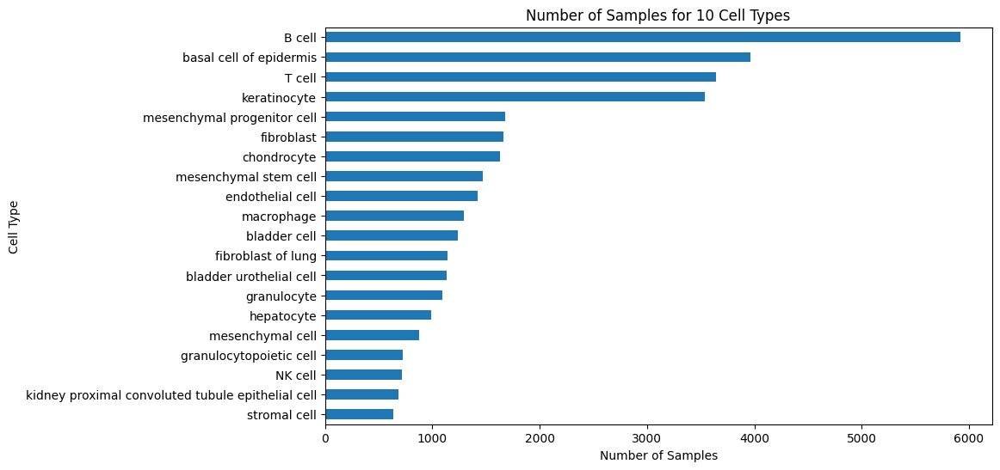

In [7]:
top_10_class_counts = adata_sub.obs['cell_ontology_class'].value_counts().sort_values(ascending=False).head(20)

plt.figure(figsize=(10,6))
top_10_class_counts.plot(kind='barh')
plt.xlabel('Number of Samples')
plt.ylabel('Cell Type')
plt.title('Number of Samples for 10 Cell Types')
plt.gca().invert_yaxis()
plt.show()

In [4]:
for cell_type, count in top_10_class_counts.items():
    print(f"{cell_type}: {count}")

B cell: 5918
basal cell of epidermis: 3964
T cell: 3643
keratinocyte: 3536
mesenchymal progenitor cell: 1676
fibroblast: 1666
chondrocyte: 1630
mesenchymal stem cell: 1468
endothelial cell: 1418
macrophage: 1290


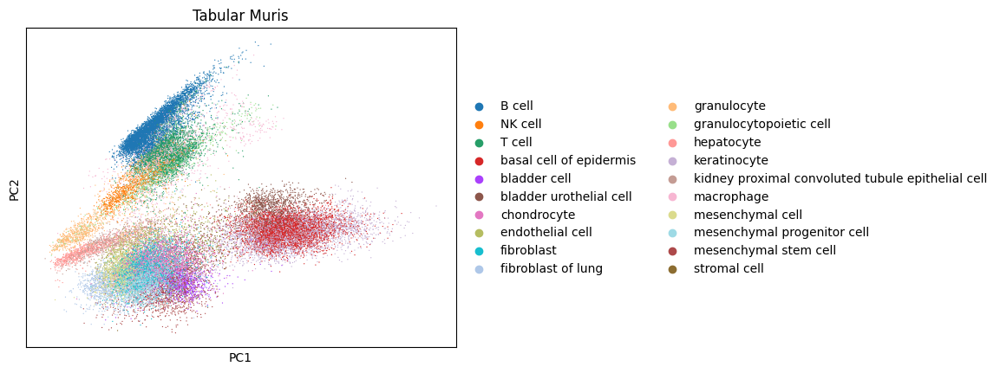

In [8]:
# run pca to select highly variable genes
sc.pp.pca(adata_sub, n_comps=50)
# plot pca
sc.pl.pca(adata_sub, color='cell_ontology_class', title='Tabular Muris',show=True)
# save pca layers
adata_sub.obsm['X_pca'] = adata_sub.obsm['X_pca'].copy()


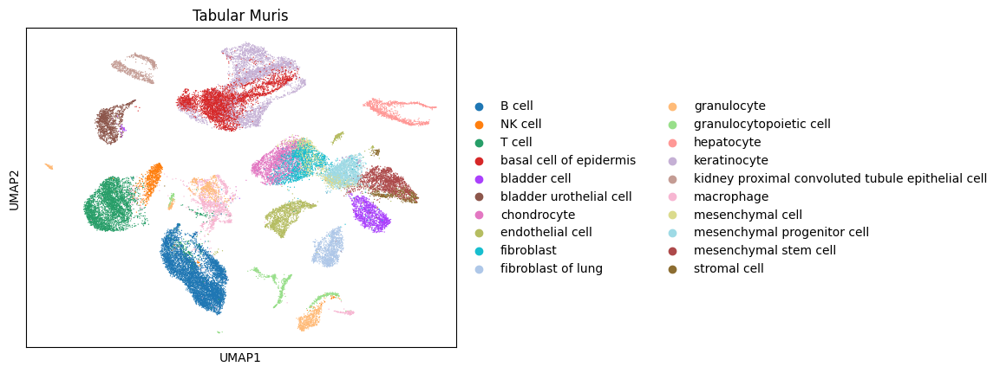

In [9]:
# running umap
sc.pp.neighbors(adata_sub)
sc.tl.umap(adata_sub)
# plot umap
sc.pl.umap(adata_sub, color='cell_ontology_class',title='Tabular Muris', show=True)


Interpretation: The data seems cluster together, with B cell, T cell and mesenchymal are in separate cluster. Meanwhile basal and keratino are in the same cluster.

# Implementing Stable Diffusion model

In [33]:
##############################################
# 1. CONFIGURATION 
##############################################

class Config:
    # Data params
    batch_size = 320
    num_timesteps = 1000
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Model params
    input_dim = None  # set after loading data
    num_classes = None  # set after encoding labels
    hidden_dim = 512
    time_emb_dim = 128
    label_emb_dim = 128
    num_res_blocks = 6
    lr = 1e-3
    max_epochs = 1000

    # Early stopping
    patience = 20

    # Sampling params for log-normal prior
    log_prior_mu = 0
    log_prior_sigma = 1
    eps = 1e-6

    # Noise scheduler
    schedule_type = 'linear'

config = Config()


##############################################
# 2. UTILITIES
##############################################

def compute_pdist(X, Y=None, metric='euclidean'):
    if Y is None:
        Y = X
    return pairwise_distances(X, Y, metric=metric, n_jobs=-1)

def energy_distance(X, Y):
    XX = compute_pdist(X)
    YY = compute_pdist(Y)
    XY = compute_pdist(X, Y)
    return np.sqrt(2*np.mean(XY) - np.mean(XX) - np.mean(YY))

def classwise_energy_distance(real_data, generated_data, labels_encoded, generated_labels):
    energy_distances = []
    print("Energy Distance (per class):")
    for cls in np.unique(labels_encoded):
        real_cls_data = real_data[labels_encoded == cls]
        gen_cls_data = generated_data[generated_labels == cls]

        ed_cls = energy_distance(real_cls_data, gen_cls_data)
        energy_distances.append(ed_cls)

        class_name = le.inverse_transform([cls])[0]
        print(f"Class {class_name}: {ed_cls:.4f}")

    avg_ed = np.mean(energy_distances)
    return avg_ed


##############################################
# 3. MODEL IMPLEMENTATION
##############################################
class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, t):
        device = t.device
        half_dim = self.dim // 2
        emb = torch.exp(torch.arange(half_dim, device=device) * -(torch.log(torch.tensor(10000.0)) / (half_dim - 1)))
        emb = t[:, None] * emb[None, :]
        emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=-1)
        return emb

class ResidualBlock(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.net = nn.Sequential(
            DenseBatchNorm(dim, dim*2,  activation='relu'),
            DenseBatchNorm(dim*2, dim)
        )
    def forward(self, x):
        return x + self.net(x)

class DenseBatchNorm(nn.Module):
    def __init__(self,in_units,out_units,activation=None):
        super().__init__()
        layers = [
            nn.Linear(in_units,out_units),
            nn.BatchNorm1d(out_units)
        ]
        if activation == 'relu':
            layers.append(nn.ReLU())
        self.dense_bn_act = nn.Sequential(*layers)

    def forward(self,x):
        return self.dense_bn_act(x)

class StableDiffusion(nn.Module):
    def __init__(self, input_dim, num_classes, hidden_dim=256, time_emb_dim=128, label_emb_dim=128, num_res_blocks=4):
        super().__init__()
        self.time_embedding = SinusoidalPosEmb(time_emb_dim)
        self.time_mlp = DenseBatchNorm(time_emb_dim, hidden_dim, activation='relu')
        self.label_embedding = nn.Embedding(num_classes, label_emb_dim)
        self.init_proj = DenseBatchNorm(input_dim + hidden_dim + label_emb_dim,
                                             hidden_dim, activation='relu')
        self.res_blocks = nn.ModuleList([ResidualBlock(hidden_dim) for _ in range(num_res_blocks)])
        self.final_layer = nn.Linear(hidden_dim, input_dim)

    def forward(self, x, t, labels):
        t_emb = self.time_embedding(t)
        t_emb = self.time_mlp(t_emb)
        label_emb = self.label_embedding(labels)
        h = torch.cat([x, t_emb, label_emb], dim=-1)
        h = self.init_proj(h)
        for block in self.res_blocks:
            h = block(h)
        return self.final_layer(h)


class DiffusionProcess:
    def __init__(self,input_dim,num_timesteps=1000,beta_start=1e-5,
                 beta_end=0.02, schedule_type=config.schedule_type):
        self.input_dim = input_dim
        self.num_timesteps = num_timesteps

        if schedule_type == 'linear':
            beta = torch.linspace(beta_start, beta_end, num_timesteps)
        elif schedule_type == 'cosine':
            beta = self._cosine_schedule(num_timesteps)
        else:
            raise ValueError("Unsupported schedule type. Use 'linear' or 'cosine'.")

        self.beta = beta
        self.alpha = 1 - beta
        self.alpha_bar = torch.cumprod(self.alpha, dim=0)

    def _cosine_schedule(self, num_timesteps, s=0.008):
        steps = torch.arange(num_timesteps + 1)/ num_timesteps
        alpha_bar = torch.cos((steps + s) / (1 + s) * torch.pi * 0.5) ** 2
        alpha_bar = alpha_bar / alpha_bar[0]
        beta = 1 - alpha_bar[1:] / alpha_bar[:-1]
        return torch.clamp(beta, 1e-4, 0.9999)

    def add_noise(self, x, t):
        noise = torch.randn_like(x)
        alpha_bar_t = self.alpha_bar[t]
        noisy_x = torch.sqrt(alpha_bar_t) * x + torch.sqrt(1 - alpha_bar_t) * noise
        return noisy_x, noise

class DiffusionProcessLogNormal:
    def __init__(self, input_dim, num_timesteps=1000, beta_start=1e-5, 
                 beta_end=0.02, schedule_type=config.schedule_type, 
                 mu=config.log_prior_mu, 
                 sigma=config.log_prior_sigma,clip_std=4.0):
        self.input_dim = input_dim
        self.mu = mu
        self.sigma = sigma
        self.num_timesteps = num_timesteps

        if schedule_type == 'linear':
            beta = torch.linspace(beta_start, beta_end, num_timesteps)
        elif schedule_type == 'cosine':
            beta = self._cosine_schedule(num_timesteps)
        else:
            raise ValueError("Unsupported schedule type. Use 'linear' or 'cosine'.")

        self.beta = beta
        self.alpha = 1 - beta
        self.alpha_bar = torch.cumprod(self.alpha, dim=0)
        self.lognormal = torch.distributions.LogNormal(self.mu, self.sigma)
        self.clip_std   = clip_std # to avoid too extreme value caused by log-normal

    def _cosine_schedule(self, num_timesteps, s=0.008):
        steps = torch.arange(num_timesteps + 1)/ num_timesteps
        alpha_bar = torch.cos((steps + s) / (1 + s) * torch.pi * 0.5) ** 2
        alpha_bar = alpha_bar / alpha_bar[0]
        alpha_bar[-1] =0.0
        beta = 1 - alpha_bar[1:] / alpha_bar[:-1]
        return torch.clamp(beta, 1e-4, 0.9999)

    def add_noise(self, x, t):
        # original data has been log-trans, need to convert back to linear scale
        x_lin = torch.expm1(x)
        log_normal_noise = self.lognormal.sample(x_lin.shape)
        log_normal_noise = torch.clamp(log_normal_noise,
                        self.lognormal.mean - self.clip_std*self.lognormal.stddev,
                        self.lognormal.mean + self.clip_std*self.lognormal.stddev)
        log_normal_noise  = torch.exp(log_normal_noise)

        alpha_bar_t = self.alpha_bar[t]
        noisy_x = torch.sqrt(alpha_bar_t) * x_lin + torch.sqrt(1 - alpha_bar_t) * log_normal_noise

        # convert back to log space
        x_noisy_log = torch.log1p(noisy_x)
        return x_noisy_log, torch.log1p(log_normal_noise)

class DiffusionDataset(Dataset):
    def __init__(self,X,labels,diffusion,num_timesteps):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.long)
        self.diffusion = diffusion
        self.num_timesteps = num_timesteps

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x = self.X[idx]
        t = torch.randint(0, self.diffusion.num_timesteps, ()).long()
        label = self.labels[idx]
        x_noisy, noise = self.diffusion.add_noise(x, t)
        return (x_noisy,t,label), noise

def prepare_dataset(X,labels,diffusion,batch_size,num_timesteps=1000):
    dataset = DiffusionDataset(X, labels,diffusion, num_timesteps)
    dataloader = DataLoader(dataset,
                            batch_size=batch_size,
                            shuffle=True,
                            pin_memory=True)
    return dataloader


class DiffusionDatasetLog(Dataset):
    def __init__(self, X, labels, diffusion, num_timesteps, eps=1e-6):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.long)
        self.diffusion = diffusion
        self.num_timesteps = num_timesteps

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x_log = self.X[idx]
        t = torch.randint(0,self.diffusion.num_timesteps, ()).long()
        label = self.labels[idx]
        x_noisy, noise = self.diffusion.add_noise(x_log, t)
        return (x_noisy, t, label), noise

def prepare_dataset_log(X, labels, diffusion, batch_size, num_timesteps=1000):
    dataset = DiffusionDatasetLog(X, labels, diffusion, num_timesteps)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
    return dataloader



##############################################
# 4. SAMPLING
##############################################

def sample(models,diffusion,labels,num_samples,device='cuda'):
    if not isinstance(models, list):
        models = [models]

    samples = torch.randn(num_samples, diffusion.input_dim).to(device)

    for t in reversed(range(diffusion.num_timesteps)):
        timestep = torch.full((num_samples,), t, dtype=torch.long).to(device)

        pred_noise = torch.zeros_like(samples).to(device)
        for model in models:
            model.eval()
            with torch.no_grad():
                pred = model(samples, timestep, labels)
            pred_noise += pred
        pred_noise /= len(models)

        alpha_bar_t = diffusion.alpha_bar[t].to(device)
        alpha_bar_prev = diffusion.alpha_bar[t-1].to(device) if t > 0 else torch.tensor(1.0).to(device)
        alpha_t = alpha_bar_t/alpha_bar_prev

        coef = diffusion.beta[t].to(device)/torch.sqrt(1 - alpha_bar_t)

        samples = (samples - coef * pred_noise) / torch.sqrt(alpha_t)
        if t > 0:
            noise = torch.randn_like(samples)
            samples += torch.sqrt(diffusion.beta[t]) * noise

    return samples.cpu().numpy()

def sample_log_normal(model,diffusion,labels,num_samples,device='cuda'):
    
    log_normal_dist = torch.distributions.LogNormal(config.log_prior_mu, config.log_prior_sigma)
    lin0 = log_normal_dist.sample((num_samples, config.input_dim)).to(device)
    samples_log = torch.log1p(lin0)

    for t in reversed(range(diffusion.num_timesteps)):
        timestep = torch.full((num_samples,), t, dtype=torch.long).to(device)
        pred_noise = torch.zeros_like(samples_log).to(device)

        model.eval()
        with torch.no_grad():
            pred = model(samples_log, timestep, labels)
        pred_noise += pred

        alpha_bar_t = diffusion.alpha_bar[t].to(device)
        alpha_bar_prev = diffusion.alpha_bar[t-1].to(device) if t > 0 else torch.tensor(1.0).to(device)
        alpha_t = alpha_bar_t / alpha_bar_prev

        coef = diffusion.beta[t].to(device) / torch.sqrt(1 - alpha_bar_t)

        x_lin = torch.expm1(samples_log)
        updated = (x_lin - coef * pred_noise) / torch.sqrt(alpha_t)
        if t > 0:
            noise = torch.randn_like(updated)
            updated += torch.sqrt(diffusion.beta[t]) * noise

    # Put in the range 0-10 to avoid extreme value
        samples_log = torch.log1p(updated.clamp(min=0))

    return samples_log

##############################################
# 5. GENERATE SYNTHETIC DATA
##############################################

def generate_synthetic_data(model, diffusion, labels_encoded, num_samples_per_class, device):
    model.eval()
    unique_labels = np.unique(labels_encoded)
    generated_data = []
    generated_labels = []

    for label in unique_labels:
        label_tensor = torch.full((num_samples_per_class,), label, dtype=torch.long).to(device)
        samples = sample(model, diffusion, label_tensor, num_samples_per_class, device=device)
        generated_data.append(samples)
        generated_labels.extend([label] * num_samples_per_class)

    generated_data = np.vstack(generated_data)
    generated_labels = np.array(generated_labels)
    return generated_data, generated_labels

def generate_synthetic_data_log(model, diffusion, labels_encoded, num_samples_per_class, device):
    model.eval()
    unique_labels = np.unique(labels_encoded)
    generated_data = []
    generated_labels = []

    for label in unique_labels:
        label_tensor = torch.full((num_samples_per_class,), label, dtype=torch.long).to(device)
        samples = sample_log_normal(model, diffusion, label_tensor, num_samples_per_class, device=device)
        generated_data.append(samples.cpu().numpy())
        generated_labels.extend([label] * num_samples_per_class)

    generated_data = np.vstack(generated_data)
    generated_labels = np.array(generated_labels)

    return generated_data, generated_labels


##############################################
# 6. TRAINING LOOP
##############################################

def train_loop(config, model, train_loader, val_loader):
    optimizer = torch.optim.Adam(model.parameters(), lr=config.lr)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    best_val_loss = float('inf')
    trigger_times = 0

    train_losses = []
    val_losses = []

    for epoch in range(config.max_epochs):
        model.train()
        train_loss_accum = 0.0
        num_batches = 0

        for (x_noisy, t, label_batch), noise in train_loader:
            x_noisy = x_noisy.to(config.device)
            t = t.to(config.device)
            label_batch = label_batch.to(config.device)
            noise = noise.to(config.device)

            pred_noise = model(x_noisy, t, label_batch)
            loss = F.mse_loss(pred_noise, noise)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss_accum += loss.item()
            num_batches += 1

        avg_train_loss = train_loss_accum / num_batches
        train_losses.append(avg_train_loss)

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for (x_noisy, t, label_batch), noise in val_loader:
                x_noisy = x_noisy.to(config.device)
                t = t.to(config.device)
                label_batch = label_batch.to(config.device)
                noise = noise.to(config.device)

                pred_noise = model(x_noisy, t, label_batch)
                val_loss += F.mse_loss(pred_noise, noise).item()
        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}/{config.max_epochs} - Train Loss: {avg_train_loss:.6f} - Val Loss: {val_loss:.6f}")

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= config.patience:
                print(f"Early stopping triggered at epoch {epoch+1}")
                break
        scheduler.step()
    return train_losses, val_losses


def train_loop_log(config, model, train_loader, val_loader):
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4) 
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    best_val_loss = float('inf')
    trigger_times = 0

    train_losses = []
    val_losses = []

    for epoch in range(config.max_epochs):
        model.train()
        train_loss_accum = 0.0
        num_batches = 0

        for (x_noisy, t, label_batch), noise in train_loader:
            x_noisy = x_noisy.to(config.device)
            t = t.to(config.device)
            label_batch = label_batch.to(config.device)
            noise = noise.to(config.device)

        
            pred_noise = model(x_noisy, t, label_batch)

        
            loss = F.mse_loss(pred_noise, noise)
       

            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
            optimizer.step()

            train_loss_accum += loss.item()
            num_batches += 1

        avg_train_loss = train_loss_accum / num_batches
        train_losses.append(avg_train_loss)

        # Validation loop
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for (x_noisy, t, label_batch), noise in val_loader:
                x_noisy = x_noisy.to(config.device)
                t = t.to(config.device)
                label_batch = label_batch.to(config.device)
                noise = noise.to(config.device)

                pred_noise = model(x_noisy, t, label_batch)

                val_loss += F.mse_loss(pred_noise, noise).item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}/{config.max_epochs} - Train Loss: {avg_train_loss:.6f} - Val Loss: {val_loss:.6f}")

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= config.patience:
                print(f"Early stopping triggered at epoch {epoch+1}")
                break
        scheduler.step()
    return train_losses, val_losses


In [3]:
import numpy as np
import scanpy as sc
from scipy.stats import spearmanr
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.model_selection import train_test_split

def spearman_per_class(real, real_labels, gen, gen_labels):
    """
    For each class:
      • compute the mean expression per-gene in real (mu_r) and generated (mu_g)
      • compute rho = spearmanr(mu_r, mu_g)
    Return the class-average of those rhos.
    """
    cls_rhos = []
    for cls in np.unique(real_labels):
        R = real [real_labels == cls]
        G = gen  [gen_labels  == cls]
        if R.shape[0] == 0 or G.shape[0] == 0:
            continue

        mu_r = np.mean(R, axis=0)
        mu_g = np.mean(G, axis=0)
        rho, _ = spearmanr(mu_r, mu_g)
        cls_rhos.append(rho)

    return np.nanmean(cls_rhos)

def mmd_per_class(real, real_labels, gen, gen_labels, gamma=None):
    def mmd(X, Y):
        γ = 1.0/X.shape[1] if gamma is None else gamma
        return (rbf_kernel(X,X,γ).mean() +
                rbf_kernel(Y,Y,γ).mean() -
                2*rbf_kernel(X,Y,γ).mean())
    scores = []
    for cls in np.unique(real_labels):
        r = real[ real_labels == cls ]
        g = gen[ gen_labels  == cls ]
        scores.append(mmd(r, g))
    return np.mean(scores)

def rf_auc_per_class(real, real_labels, gen, gen_labels):
    aucs = []
    for cls in np.unique(real_labels):
        r = real[ real_labels == cls ]
        g = gen[ gen_labels  == cls ]
        X = np.vstack([r, g])
        y = np.hstack([np.ones(len(r)), np.zeros(len(g))])
        rf = RandomForestClassifier(n_estimators=1000, max_depth=5, random_state=0)
        rf.fit(X, y)
        p = rf.predict_proba(X)[:,1]
        aucs.append(roc_auc_score(y, p))
    return np.mean(aucs)

def knn_eval_per_class(real, real_labels, gen, gen_labels, k=5):
    accs, aucs = [], []
    for cls in np.unique(real_labels):
        r = real[ real_labels == cls ]
        g = gen[ gen_labels  == cls ]
        X = np.vstack([r, g])
        y = np.hstack([np.ones(len(r)), np.zeros(len(g))])
        Xtr, Xte, ytr, yte = train_test_split(X, y, test_size=0.3, random_state=0)
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(Xtr, ytr)
        ypred = knn.predict(Xte)
        yprob = knn.predict_proba(Xte)[:,1]
        accs.append(accuracy_score(yte, ypred))
        aucs.append(roc_auc_score(yte, yprob))
    return np.mean(accs), np.mean(aucs)

def knn_auc_per_class(real, real_labels, gen, gen_labels, k=5):
    """
    Returns:
       classes:  sorted array of class labels
       aucs:     list of AUC (float) for each class, in the same order
    """
    classes = np.unique(real_labels)
    aucs    = []
    for cls in classes:
        Xr = real[ real_labels == cls ]
        Xg = gen [ gen_labels  == cls ]
        X  = np.vstack([Xr, Xg])
        y  = np.hstack([np.ones(len(Xr)), np.zeros(len(Xg))])
        Xtr, Xte, ytr, yte = train_test_split(X, y, test_size=0.3, random_state=0)
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(Xtr, ytr)
        probs = knn.predict_proba(Xte)[:,1]
        aucs.append(roc_auc_score(yte, probs))
    return classes, aucs


def evaluate_all(
    real_data: np.ndarray,
    gen_data:  np.ndarray,
    real_labels: np.ndarray,
    gen_labels:  np.ndarray,
    adata_real,
    adata_gen
):
    scc     = spearman_per_class(real_data, real_labels, gen_data, gen_labels)
    mmd     = mmd_per_class    (real_data, real_labels, gen_data, gen_labels)
    rf_auc  = rf_auc_per_class (real_data, real_labels, gen_data, gen_labels)
    knn_acc, knn_auc = knn_eval_per_class(real_data, real_labels, gen_data, gen_labels)

    print(f"Spearman SCC: {scc:.4f}")
    print(f"MMD:          {mmd:.4f}")
    print(f"RF AUC:       {rf_auc:.4f}")
    print(f"KNN Acc:      {knn_acc:.4f}, KNN AUC: {knn_auc:.4f}")

    return {
        'scc':      scc,
        'mmd':      mmd,
        'rf_auc':   rf_auc,
        'knn_acc':  knn_acc,
        'knn_auc':  knn_auc,
    }


In [6]:
# Convert sparse matrix to dense
X = adata_sub.X
if scipy.sparse.issparse(X):
    X = X.toarray()

labels = adata_sub.obs['cell_ontology_class'].values
le = LabelEncoder()
labels_encoded = le.fit_transform(labels)

# parameter for config
config.input_dim = X.shape[1]
config.num_classes = len(np.unique(labels_encoded))

# Split data
X_train, X_val, y_train, y_val = train_test_split(
    X, labels_encoded,
    test_size=0.2,
    random_state=42,
    stratify=labels_encoded
)

# Training for normal distribution prior

In [ ]:
if __name__ == "__main__":
    # Initialize diffusion process (normal prior)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    diffusion = DiffusionProcess(config.input_dim,
                                 num_timesteps=config.num_timesteps,
                                 schedule_type='linear')
    train_loader = prepare_dataset(X_train, y_train, diffusion, batch_size=config.batch_size)
    val_loader   = prepare_dataset(X_val,   y_val,   diffusion, batch_size=config.batch_size)

    # Initialize model
    model = StableDiffusion(
        input_dim=config.input_dim,
        num_classes=config.num_classes,
        hidden_dim=config.hidden_dim,
        time_emb_dim=config.time_emb_dim,
        label_emb_dim=config.label_emb_dim,
        num_res_blocks=config.num_res_blocks
    ).to(config.device)

    # Train with normal prior data preparation
    train_losses, val_losses = train_loop(config=config,
                                            model=model,
                                            train_loader=train_loader,
                                            val_loader=val_loader)

    # Save the trained model weights
    torch.save(model.state_dict(), './weight_rare/stable_diffusion_normal_prior.pth')
    print("Model trained and saved with normal prior.")

    # Load your trained model weights (normal prior model)
    model.load_state_dict(torch.load('./weight_rare/stable_diffusion_normal_prior.pth', map_location=device))
    model.eval()

    # Generate synthetic data per class
    num_samples_per_class = 5000
    generated_data_normal, generated_labels_normal = generate_synthetic_data(model, diffusion, labels_encoded, num_samples_per_class, device)



Epoch 1/1000 - Train Loss: 1.034834 - Val Loss: 0.617758


Epoch 2/1000 - Train Loss: 0.448388 - Val Loss: 0.343982
Epoch 3/1000 - Train Loss: 0.296682 - Val Loss: 0.290419
Epoch 4/1000 - Train Loss: 0.252987 - Val Loss: 0.257659
Epoch 5/1000 - Train Loss: 0.234559 - Val Loss: 0.247555
Epoch 6/1000 - Train Loss: 0.220412 - Val Loss: 0.239950
Epoch 7/1000 - Train Loss: 0.212313 - Val Loss: 0.238350
Epoch 8/1000 - Train Loss: 0.207607 - Val Loss: 0.223507
Epoch 9/1000 - Train Loss: 0.205863 - Val Loss: 0.232312
Epoch 10/1000 - Train Loss: 0.199360 - Val Loss: 0.218830
Epoch 11/1000 - Train Loss: 0.192719 - Val Loss: 0.206528
Epoch 12/1000 - Train Loss: 0.186310 - Val Loss: 0.200652
Epoch 13/1000 - Train Loss: 0.186278 - Val Loss: 0.205437
Epoch 14/1000 - Train Loss: 0.186158 - Val Loss: 0.198352
Epoch 15/1000 - Train Loss: 0.187825 - Val Loss: 0.204618
Epoch 16/1000 - Train Loss: 0.185663 - Val Loss: 0.202799
Epoch 17/1000 - Train Loss: 0.180825 - Val Loss: 0.202383
Epoch 18/1000 - Train Loss: 0.180402 - Val Loss: 0.210583
Epoch 19/1000 - Train 

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
diffusion = DiffusionProcess(config.input_dim,
                                 num_timesteps=config.num_timesteps,
                                 schedule_type='linear')
model = StableDiffusion(
        input_dim=config.input_dim,
        num_classes=config.num_classes,
        hidden_dim=config.hidden_dim,
        time_emb_dim=config.time_emb_dim,
        label_emb_dim=config.label_emb_dim,
        num_res_blocks=config.num_res_blocks
    ).to(config.device)

# Load your trained model weights (normal prior model)
model.load_state_dict(torch.load('./weight_rare/stable_diffusion_normal_prior.pth', map_location=device))
model.eval()

# Generate synthetic data per class
num_samples_per_class = 5000
generated_data_normal, generated_labels_normal = generate_synthetic_data(model, diffusion, labels_encoded, num_samples_per_class, device)

In [ ]:
classwise_energy_distance(real_data=X, generated_data=generated_data_normal, labels_encoded=labels_encoded, generated_labels=generated_labels_normal)


Energy Distance (per class):


Class B cell: 0.2540
Class NK cell: 0.2615
Class T cell: 0.2362
Class basal cell of epidermis: 0.2305
Class bladder cell: 0.2444
Class bladder urothelial cell: 0.3410
Class chondrocyte: 0.1935
Class endothelial cell: 0.1892
Class fibroblast: 0.1732
Class fibroblast of lung: 0.2068
Class granulocyte: 0.9189
Class granulocytopoietic cell: 0.6312
Class hepatocyte: 0.2903
Class keratinocyte: 0.2212
Class kidney proximal convoluted tubule epithelial cell: 0.2455
Class macrophage: 0.3930
Class mesenchymal cell: 0.2805
Class mesenchymal progenitor cell: 0.2010
Class mesenchymal stem cell: 0.2108
Class stromal cell: 0.2748


0.29986525686494925

In [ ]:
import matplotlib as mpl

mpl.rcParams.update({
    'font.size':         12,   # base size for all text
    'axes.titlesize':    12,
    'axes.labelsize':    12,
    'xtick.labelsize':   12,
    'ytick.labelsize':   12,
    'legend.fontsize':   12,
    'legend.title_fontsize': 12,
})

In [ ]:
epochs = range(1, len(train_losses) + 1)


plt.figure(figsize=(10,5))

# Plot plain diffusion loop
plt.plot(epochs, train_losses, lw=1.5, alpha=0.7, label='Train loss')
plt.plot(epochs, val_losses,  lw=1.5, alpha=0.7,  label='Val loss')


plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('Training vs Validation Loss - Normal prior')
plt.legend()

plt.show()

# Plotting the generated and real data

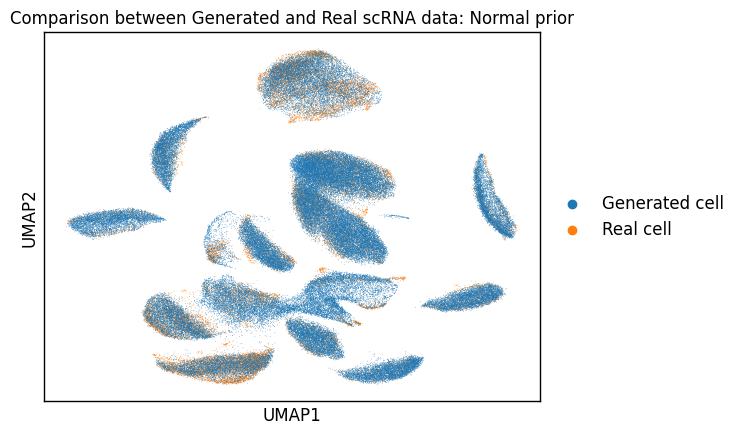

In [ ]:
adata_gen = ad.AnnData(X=generated_data_normal,var=adata_sub.var.copy())
adata_gen.obs['cell_ontology_class'] = pd.Categorical.from_codes(
    generated_labels_normal,
    categories=adata_sub.obs['cell_ontology_class'].cat.categories
)
adata_gen.obs['source'] = 'Generated cell'
adata_sub.obs['source'] = 'Real cell'

adata_plot = ad.concat(
    [adata_sub,adata_gen],
    join='outer',
    label='batch',
    keys=['real','gen'])

sc.pp.pca(adata_plot, n_comps=50)
sc.pp.neighbors(adata_plot)
sc.tl.umap(adata_plot)

fig = sc.pl.umap(
    adata_plot,
    color='source',
    title='Comparison between Generated and Real scRNA data: Normal prior',
    show=False,
    return_fig=True
)

# grab the axis
ax = fig.axes[0]

# lighten & slim down each spine
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.0)

# (optional) adjust tick color too
# ax.tick_params(color='grey', labelcolor='grey')
plt.show()



In [16]:
metrics_normal = evaluate_all(
    real_data    = adata_sub.X.toarray(),
    gen_data     = generated_data_normal,
    real_labels  = labels_encoded,
    gen_labels   = generated_labels_normal,
    adata_real   = adata_sub,
    adata_gen    = adata_gen
)

Spearman SCC: 0.9943
MMD:          0.0108
RF AUC:       1.0000
KNN Acc:      0.5990, KNN AUC: 0.8296


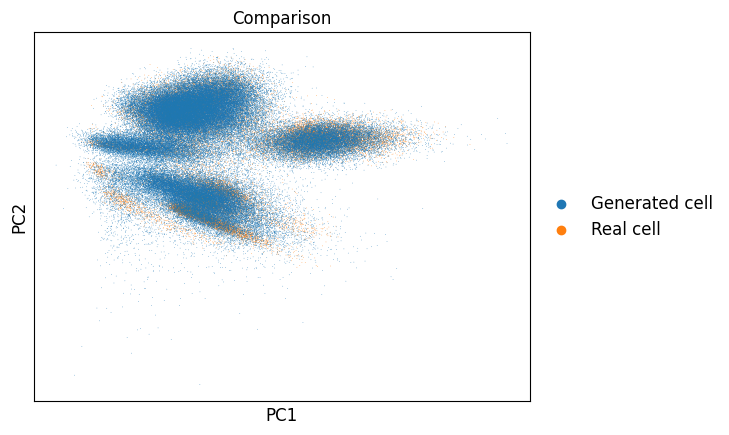

In [17]:
sc.pp.pca(adata_plot, n_comps=50)
sc.pl.pca(adata_plot, color='source', title='Comparison',show=True)

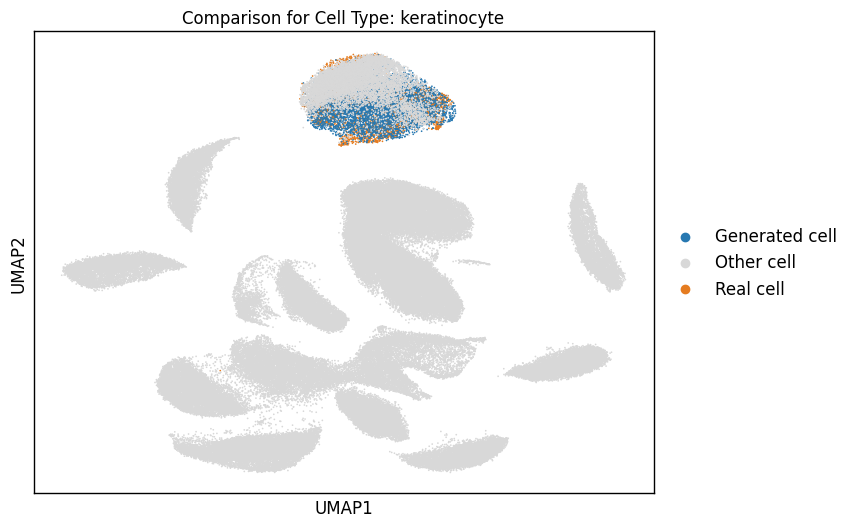

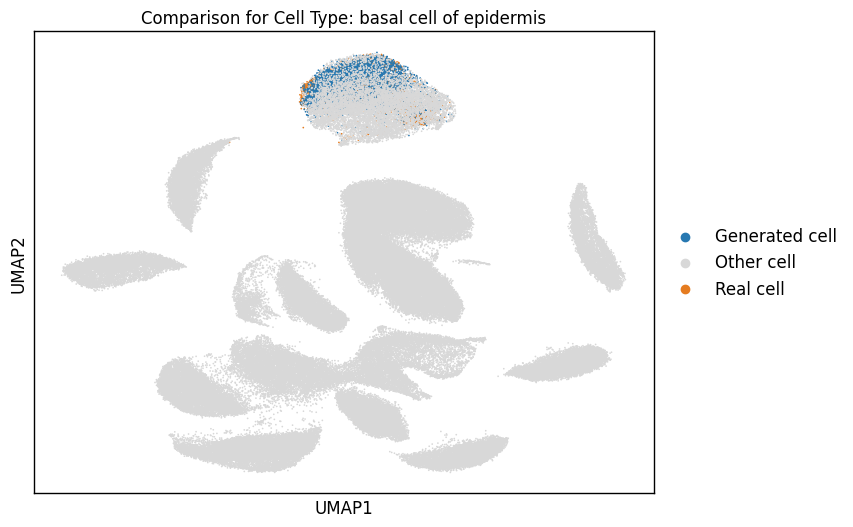

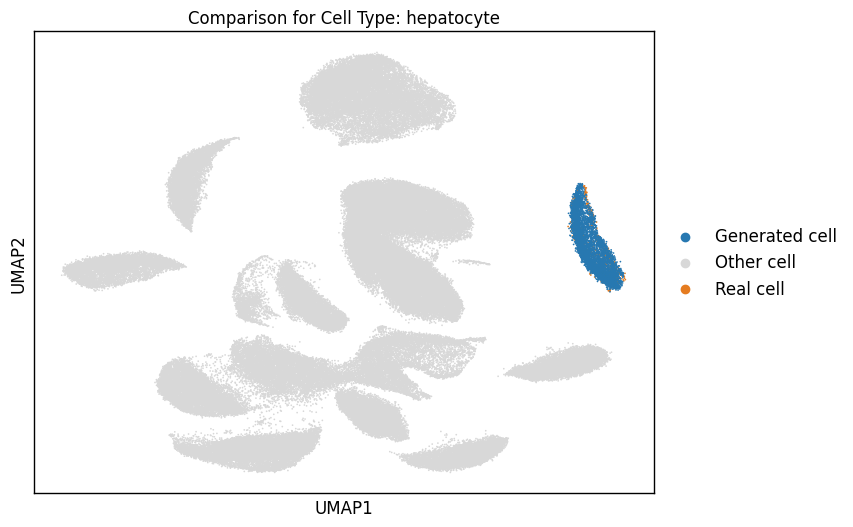

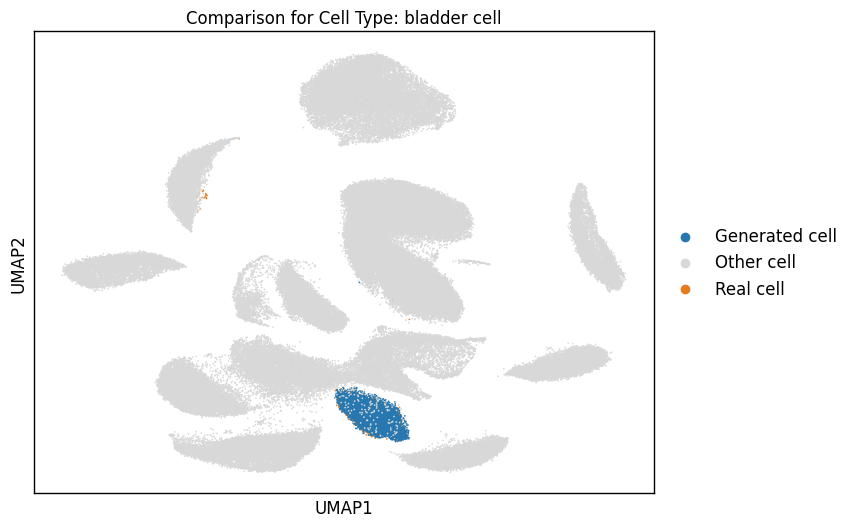

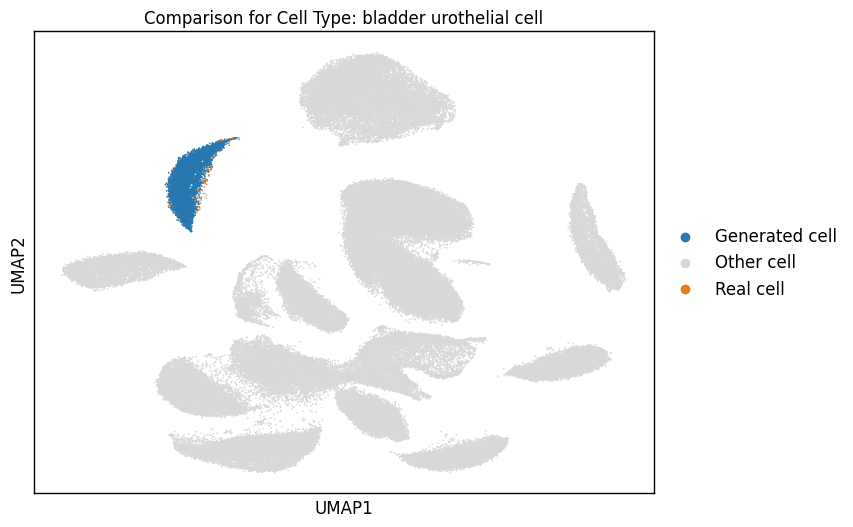

...

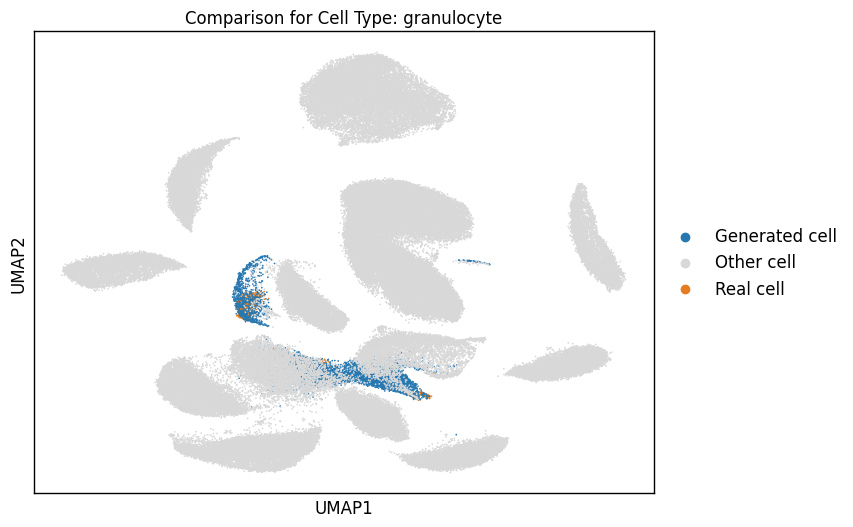

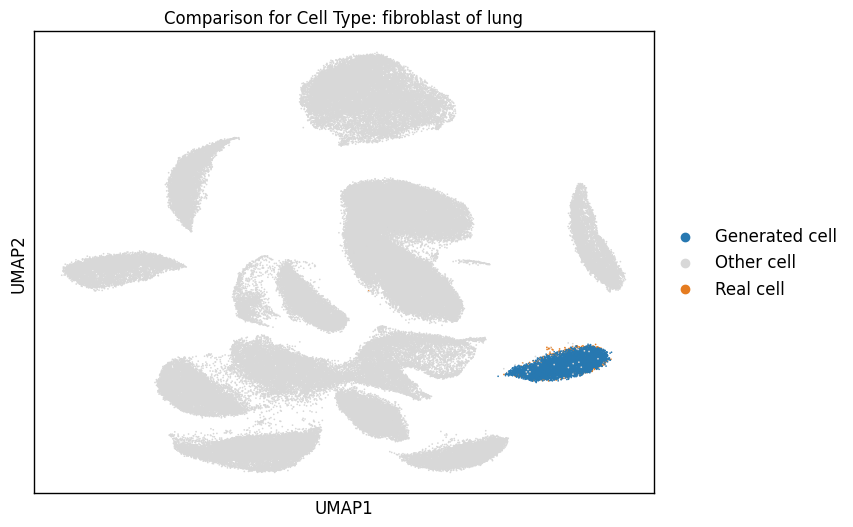

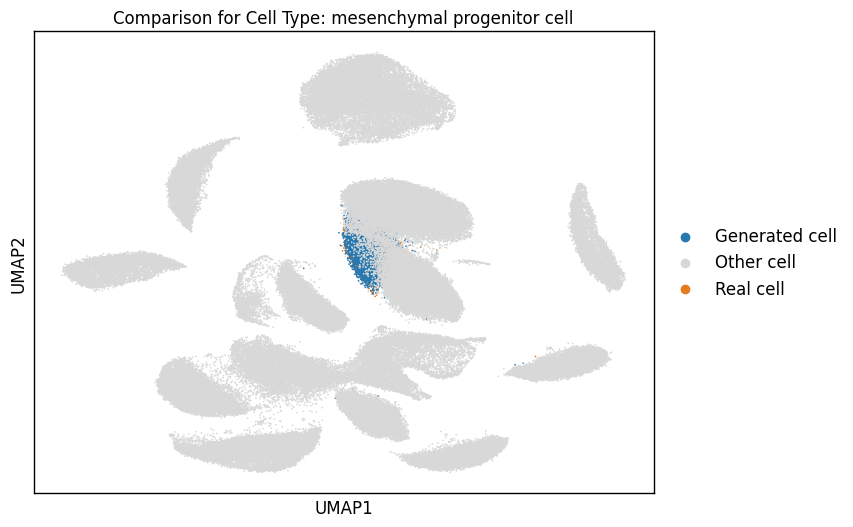

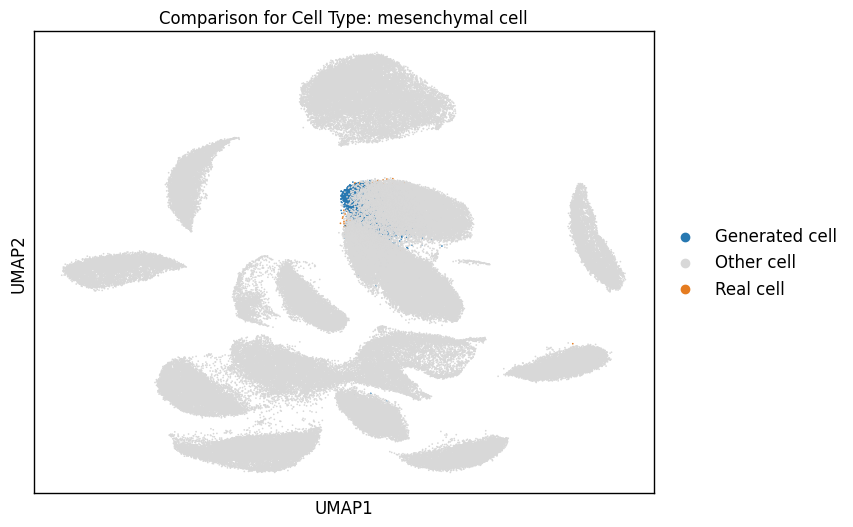

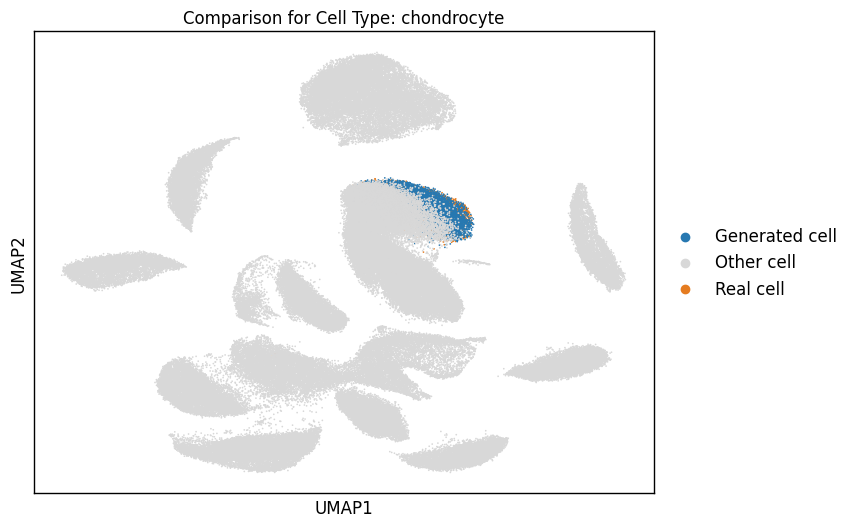

In [18]:
celltypes = adata_plot.obs['cell_ontology_class'].unique()
custom_palette = {
    'Real cell': '#e57c20',       
    'Generated cell': '#2778b1', 
    'Other cell': '#d8d8d8'     
}
for celltype in celltypes:
    fig, ax = plt.subplots(figsize=(8, 6))
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(1.0)
    
    # Filter data for the current cell type (plot only real and generated of this type)
    subset = adata_plot[adata_plot.obs['cell_ontology_class'] == celltype]
    
    # Create a mask for other cell types (all data except current cell type)
    other_cells = adata_plot[adata_plot.obs['cell_ontology_class'] != celltype].copy()
    other_cells.obs['source'] = 'Other cell'  # Label other cells as 'Other cell'
    
    # Combine the current subset (real + generated) and 'Other' cells
    combined_data = adata_plot[adata_plot.obs['cell_ontology_class'] == celltype].concatenate(other_cells)
    
    # Plot UMAP for the current cell type, highlighting real and generated cells as well as other cells in black
    sc.pl.umap(combined_data, color='source', size=6, title=f'Comparison for Cell Type: {celltype}', ax=ax,palette=custom_palette)
    
    # Show the plot
    plt.show()

# Training for log-normal distribution prior

In [7]:
##############################################
# 1. CONFIGURATION 
##############################################

class Config:
    # Data params
    batch_size = 320
    num_timesteps = 1000
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Model params
    input_dim = None  # set after loading data
    num_classes = None  # set after encoding labels
    hidden_dim = 512
    time_emb_dim = 128
    label_emb_dim = 128
    num_res_blocks = 6
    lr = 1e-3
    max_epochs = 1000

    # Early stopping
    patience = 20

    # Sampling params for log-normal prior
    log_prior_mu = 0
    log_prior_sigma = 1
    eps = 1e-6

    # Noise scheduler
    schedule_type = 'linear'

config = Config()


##############################################
# 2. UTILITIES
##############################################

def compute_pdist(X, Y=None, metric='euclidean'):
    if Y is None:
        Y = X
    return pairwise_distances(X, Y, metric=metric, n_jobs=-1)

def energy_distance(X, Y):
    XX = compute_pdist(X)
    YY = compute_pdist(Y)
    XY = compute_pdist(X, Y)
    return np.sqrt(2*np.mean(XY) - np.mean(XX) - np.mean(YY))

def classwise_energy_distance(real_data, generated_data, labels_encoded, generated_labels):
    energy_distances = []
    print("Energy Distance (per class):")
    for cls in np.unique(labels_encoded):
        real_cls_data = real_data[labels_encoded == cls]
        gen_cls_data = generated_data[generated_labels == cls]

        ed_cls = energy_distance(real_cls_data, gen_cls_data)
        energy_distances.append(ed_cls)

        class_name = le.inverse_transform([cls])[0]
        print(f"Class {class_name}: {ed_cls:.4f}")

    avg_ed = np.mean(energy_distances)
    return avg_ed


def mmd_rbf(X, Y, gamma=None):
    if gamma is None:
        gamma = 1.0 / X.shape[1]
    XX = rbf_kernel(X, X, gamma)
    YY = rbf_kernel(Y, Y, gamma)
    XY = rbf_kernel(X, Y, gamma)
    return XX.mean() + YY.mean() - 2 * XY.mean()

def classwise_mmd(real_data, generated_data, labels_encoded, generated_labels):
    mmd_scores = []
    print("MMD (per class):")
    for cls in np.unique(labels_encoded):
        real_cls_data = real_data[labels_encoded == cls]
        gen_cls_data = generated_data[generated_labels == cls]

        mmd_cls = mmd_rbf(real_cls_data, gen_cls_data)
        mmd_scores.append(mmd_cls)

        class_name = le.inverse_transform([cls])[0]
        print(f"Class {class_name}: {mmd_cls:.4f}")

    avg_mmd = np.mean(mmd_scores)
    return avg_mmd


##############################################
# 3. MODEL IMPLEMENTATION
##############################################
class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, t):
        device = t.device
        half_dim = self.dim // 2
        emb = torch.exp(torch.arange(half_dim, device=device) * -(torch.log(torch.tensor(10000.0)) / (half_dim - 1)))
        emb = t[:, None] * emb[None, :]
        emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=-1)
        return emb

class ResidualBlock(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.net = nn.Sequential(
            DenseBatchNorm(dim, dim*2,  activation='relu'),
            DenseBatchNorm(dim*2, dim)
        )
    def forward(self, x):
        return x + self.net(x)

class DenseBatchNorm(nn.Module):
    def __init__(self,in_units,out_units,activation=None):
        super().__init__()
        layers = [
            nn.Linear(in_units,out_units),
            nn.BatchNorm1d(out_units)
        ]
        if activation == 'relu':
            layers.append(nn.ReLU())
        self.dense_bn_act = nn.Sequential(*layers)

    def forward(self,x):
        return self.dense_bn_act(x)

class StableDiffusion(nn.Module):
    def __init__(self, input_dim, num_classes, hidden_dim=256, time_emb_dim=128, label_emb_dim=128, num_res_blocks=4):
        super().__init__()
        self.time_embedding = SinusoidalPosEmb(time_emb_dim)
        self.time_mlp = DenseBatchNorm(time_emb_dim, hidden_dim, activation='relu')
        self.label_embedding = nn.Embedding(num_classes, label_emb_dim)
        self.init_proj = DenseBatchNorm(input_dim + hidden_dim + label_emb_dim,
                                             hidden_dim, activation='relu')
        self.res_blocks = nn.ModuleList([ResidualBlock(hidden_dim) for _ in range(num_res_blocks)])
        self.final_layer = nn.Linear(hidden_dim, input_dim)

    def forward(self, x, t, labels):
        t_emb = self.time_embedding(t)
        t_emb = self.time_mlp(t_emb)
        label_emb = self.label_embedding(labels)
        h = torch.cat([x, t_emb, label_emb], dim=-1)
        h = self.init_proj(h)
        for block in self.res_blocks:
            h = block(h)
        return F.relu(self.final_layer(h))



class DiffusionProcessLogNormal:
    def __init__(self, input_dim, num_timesteps=1000, beta_start=1e-5, 
                 beta_end=0.02, schedule_type=config.schedule_type, 
                 mu=config.log_prior_mu, 
                 sigma=config.log_prior_sigma,clip_std=4.0):
        self.input_dim = input_dim
        self.mu = mu
        self.sigma = sigma
        self.num_timesteps = num_timesteps

        if schedule_type == 'linear':
            beta = torch.linspace(beta_start, beta_end, num_timesteps)
        elif schedule_type == 'cosine':
            beta = self._cosine_schedule(num_timesteps)
        else:
            raise ValueError("Unsupported schedule type. Use 'linear' or 'cosine'.")

        self.beta = beta
        self.alpha = 1 - beta
        self.alpha_bar = torch.cumprod(self.alpha, dim=0)
        self.lognormal = torch.distributions.LogNormal(self.mu, self.sigma)
        self.clip_std   = clip_std # to avoid too extreme value caused by log-normal

    def _cosine_schedule(self, num_timesteps, s=0.008):
        steps = torch.arange(num_timesteps + 1)/ num_timesteps
        alpha_bar = torch.cos((steps + s) / (1 + s) * torch.pi * 0.5) ** 2
        alpha_bar = alpha_bar / alpha_bar[0]
        alpha_bar[-1] =0.0
        beta = 1 - alpha_bar[1:] / alpha_bar[:-1]
        return torch.clamp(beta, 1e-4, 0.9999)

    def add_noise(self, x, t):
        # original data has been log-trans, need to convert back to linear scale
        sqrt_alpha_bar_t = torch.sqrt(self.alpha_bar[t])
        sqrt_one_minus_alpha_bar_t = torch.sqrt(1.0-self.alpha_bar[t])

        # sample log-normal noise
        noise = self.lognormal.sample(x.shape)
        # create noisy sample
        noisy_x = sqrt_alpha_bar_t*x+sqrt_one_minus_alpha_bar_t*noise

        return noisy_x, noise



class DiffusionDatasetLog(Dataset):
    def __init__(self, X, labels, diffusion, num_timesteps, eps=1e-6):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.long)
        self.diffusion = diffusion
        self.num_timesteps = num_timesteps

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x_log = self.X[idx]
        t = torch.randint(0,self.diffusion.num_timesteps, ()).long()
        label = self.labels[idx]
        x_noisy, noise = self.diffusion.add_noise(x_log, t)
        return (x_noisy, t, label), noise

def prepare_dataset_log(X, labels, diffusion, batch_size, num_timesteps=1000):
    dataset = DiffusionDatasetLog(X, labels, diffusion, num_timesteps)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
    return dataloader



##############################################
# 4. SAMPLING
##############################################


def sample_log_normal(model,diffusion,labels,num_samples,device='cuda'):
    model.eval()

    # start with pure log-normal noise
    x_t = diffusion.lognormal.sample((num_samples, config.input_dim)).squeeze(-1).to(device)
    labels = labels.to(device)

    for t in reversed(range(diffusion.num_timesteps)):
        # Create a tensor of the current timestep
        timestep = torch.full((num_samples,), t, dtype=torch.long, device=device)
        
        with torch.no_grad():
            # 1. Predict noise from the model
            pred_noise = model(x_t, timestep, labels)
            
            # 2. Predict x_0 (the original data) from x_t and pred_noise
            alpha_bar_t = diffusion.alpha_bar[t]
            pred_x0 = (x_t - torch.sqrt(1 - alpha_bar_t) * pred_noise) / torch.sqrt(alpha_bar_t)
            pred_x0 = pred_x0.clamp(min=0.0,max=10) # Enforce positivity, crucial for stability

            if t == 0:
                x_t = pred_x0 # Final sample is the predicted x_0
                break

            # 3. Use the predicted x_0 to step to x_{t-1}
            alpha_bar_prev = diffusion.alpha_bar[t-1]
            # Equation from DDIM paper (Eq. 12)
            x_t = torch.sqrt(alpha_bar_prev) * pred_x0 + \
                  torch.sqrt(1 - alpha_bar_prev) * pred_noise
            x_t = x_t.clamp(min=0.0,max=10)
                  
    return x_t.cpu().numpy()
##############################################
# 5. GENERATE SYNTHETIC DATA
##############################################


def generate_synthetic_data_log(model, diffusion, labels_encoded, num_samples, device):
    """Generates synthetic data for each class."""
    model.eval()
    unique_labels = np.unique(labels_encoded)
    all_generated_data = []
    all_generated_labels = []

    print("--- Generating Synthetic Data ---")
    for label in unique_labels:
        print(f"Generating for class {le.inverse_transform([label])[0]}...")
        label_tensor = torch.full((num_samples_per_class,), label, dtype=torch.long)
        
        samples = sample_log_normal(model,
            diffusion,
            label_tensor,
            num_samples,
            device=device)
        
        all_generated_data.append(samples)
        all_generated_labels.extend([label] * num_samples)

    generated_data = np.vstack(all_generated_data)
    generated_labels = np.array(all_generated_labels)
    return generated_data, generated_labels


##############################################
# 6. TRAINING LOOP
##############################################


def train_loop_log(config, model, train_loader, val_loader):
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4) 
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)
    best_val_loss = float('inf')
    trigger_times = 0

    train_losses = []
    val_losses = []

    for epoch in range(config.max_epochs):
        model.train()
        train_loss_accum = 0.0
        num_batches = 0

        for (x_noisy, t, label_batch), noise in train_loader:
            x_noisy = x_noisy.to(config.device)
            t = t.to(config.device)
            label_batch = label_batch.to(config.device)
            noise = noise.to(config.device)

        
            pred_noise = model(x_noisy, t, label_batch)

        
            loss = F.mse_loss(pred_noise, noise)
       

            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1)
            optimizer.step()

            train_loss_accum += loss.item()
            num_batches += 1

        avg_train_loss = train_loss_accum / num_batches
        train_losses.append(avg_train_loss)

        # Validation loop
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for (x_noisy, t, label_batch), noise in val_loader:
                x_noisy = x_noisy.to(config.device)
                t = t.to(config.device)
                label_batch = label_batch.to(config.device)
                noise = noise.to(config.device)

                pred_noise = model(x_noisy, t, label_batch)

                val_loss += F.mse_loss(pred_noise, noise).item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}/{config.max_epochs} - Train Loss: {avg_train_loss:.6f} - Val Loss: {val_loss:.6f}")

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            trigger_times = 0
        else:
            trigger_times += 1
            if trigger_times >= config.patience:
                print(f"Early stopping triggered at epoch {epoch+1}")
                break
        scheduler.step()
    return train_losses, val_losses

In [8]:
# Convert sparse matrix to dense
X = adata_sub.X
if scipy.sparse.issparse(X):
    X = X.toarray()

labels = adata_sub.obs['cell_ontology_class'].values
le = LabelEncoder()
labels_encoded = le.fit_transform(labels)

# parameter for config
config.input_dim = X.shape[1]
config.num_classes = len(np.unique(labels_encoded))

# Split data
X_train, X_val, y_train, y_val = train_test_split(
    X, labels_encoded,
    test_size=0.2,
    random_state=42,
    stratify=labels_encoded
)

In [9]:
if __name__ == "__main__":
    # Initialize diffusion process (normal prior)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    diffusion = DiffusionProcessLogNormal(config.input_dim,
                                 num_timesteps=config.num_timesteps,
                                 schedule_type='cosine')
    train_loader = prepare_dataset_log(X_train, y_train, diffusion, batch_size=config.batch_size)
    val_loader   = prepare_dataset_log(X_val,   y_val,   diffusion, batch_size=config.batch_size)

    # Initialize model
    model = StableDiffusion(
        input_dim=config.input_dim,
        num_classes=config.num_classes,
        hidden_dim=config.hidden_dim,
        time_emb_dim=config.time_emb_dim,
        label_emb_dim=config.label_emb_dim,
        num_res_blocks=config.num_res_blocks
    ).to(config.device)

    # Train with normal prior data preparation
    train_losses_log, val_losses_log = train_loop_log(
    config=config,
    model=model,
    train_loader=train_loader,
    val_loader=val_loader)

    # Save the trained model weights
    torch.save(model.state_dict(), './weight_rare/stable_diffusion_log_prior.pth')
    print("Model trained and saved with log prior.")

    # Load your trained model weights (normal prior model)
    model.load_state_dict(torch.load('./weight_rare/stable_diffusion_log_prior.pth', map_location=device))
    model.eval()

    # Generate synthetic data per class
    num_samples_per_class = 5000
    generated_data_log, generated_labels_log = generate_synthetic_data_log(model, diffusion, labels_encoded, num_samples_per_class,device)



Epoch 1/1000 - Train Loss: 4.130812 - Val Loss: 2.767665
Epoch 2/1000 - Train Loss: 2.371005 - Val Loss: 2.051891
Epoch 3/1000 - Train Loss: 1.864575 - Val Loss: 1.717193
Epoch 4/1000 - Train Loss: 1.568889 - Val Loss: 1.506096
Epoch 5/1000 - Train Loss: 1.422218 - Val Loss: 1.340925
Epoch 6/1000 - Train Loss: 1.311859 - Val Loss: 1.302016
Epoch 7/1000 - Train Loss: 1.228736 - Val Loss: 1.227997
Epoch 8/1000 - Train Loss: 1.186244 - Val Loss: 1.154351
Epoch 9/1000 - Train Loss: 1.138577 - Val Loss: 1.112542
Epoch 10/1000 - Train Loss: 1.117148 - Val Loss: 1.082906
Epoch 11/1000 - Train Loss: 1.045958 - Val Loss: 1.010028
Epoch 12/1000 - Train Loss: 1.063636 - Val Loss: 1.012905
Epoch 13/1000 - Train Loss: 1.035509 - Val Loss: 0.989220
Epoch 14/1000 - Train Loss: 1.036300 - Val Loss: 0.986824
Epoch 15/1000 - Train Loss: 1.008557 - Val Loss: 0.962918
Epoch 16/1000 - Train Loss: 1.005354 - Val Loss: 0.976052
Epoch 17/1000 - Train Loss: 0.976970 - Val Loss: 0.957048
Epoch 18/1000 - Train L

In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
diffusion = DiffusionProcessLogNormal(config.input_dim,
                                 num_timesteps=config.num_timesteps,
                                 schedule_type='cosine')
# Load your trained model weights (normal prior model)
model.load_state_dict(torch.load('./weight_rare/stable_diffusion_log_prior.pth', map_location=device))
model.eval()

# Generate synthetic data per class
num_samples_per_class = 5000
generated_data_log, generated_labels_log = generate_synthetic_data_log(model, diffusion, labels_encoded, num_samples_per_class,device)

--- Generating Synthetic Data ---
Generating for class B cell...
Generating for class NK cell...
Generating for class T cell...
Generating for class basal cell of epidermis...
Generating for class bladder cell...
Generating for class bladder urothelial cell...
Generating for class chondrocyte...
Generating for class endothelial cell...
Generating for class fibroblast...
Generating for class fibroblast of lung...
Generating for class granulocyte...
Generating for class granulocytopoietic cell...


Generating for class hepatocyte...
Generating for class keratinocyte...
Generating for class kidney proximal convoluted tubule epithelial cell...
Generating for class macrophage...
Generating for class mesenchymal cell...
Generating for class mesenchymal progenitor cell...
Generating for class mesenchymal stem cell...
Generating for class stromal cell...


In [11]:
classwise_energy_distance(real_data=X, generated_data=generated_data_log, labels_encoded=labels_encoded, generated_labels=generated_labels_log)

Energy Distance (per class):
Class B cell: 9.6694
Class NK cell: 9.9519
Class T cell: 9.7034
Class basal cell of epidermis: 8.3014
Class bladder cell: 9.2977
Class bladder urothelial cell: 8.4224
Class chondrocyte: 9.6516
Class endothelial cell: 9.8469
Class fibroblast: 9.7873
Class fibroblast of lung: 10.1560
Class granulocyte: 9.7184
Class granulocytopoietic cell: 9.0260
Class hepatocyte: 10.6001
Class keratinocyte: 8.1963
Class kidney proximal convoluted tubule epithelial cell: 10.2297
Class macrophage: 9.0124
Class mesenchymal cell: 10.1893
Class mesenchymal progenitor cell: 9.7718
Class mesenchymal stem cell: 9.4656
Class stromal cell: 9.2310


9.5114201783313

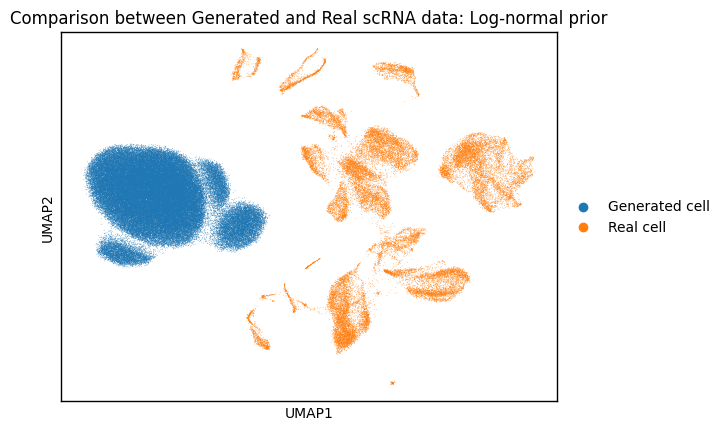

In [12]:
adata_gen_log = ad.AnnData(X=generated_data_log,var=adata_sub.var.copy())
adata_gen_log.obs['cell_ontology_class'] = pd.Categorical.from_codes(
    generated_labels_log,
    categories=adata_sub.obs['cell_ontology_class'].cat.categories
)
adata_gen_log.obs['source'] = 'Generated cell'
adata_sub.obs['source'] = 'Real cell'

adata_plot_log = ad.concat(
    [adata_sub,adata_gen_log],
    join='outer',
    label='batch',
    keys=['real','gen'])

sc.pp.pca(adata_plot_log, n_comps=50)
sc.pp.neighbors(adata_plot_log)
sc.tl.umap(adata_plot_log)

fig = sc.pl.umap(
    adata_plot_log,
    color='source',
    title='Comparison between Generated and Real scRNA data: Log-normal prior',
    show=False,
    return_fig=True
)

# grab the axis
ax = fig.axes[0]

# lighten & slim down each spine
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.0)

# (optional) adjust tick color too
# ax.tick_params(color='grey', labelcolor='grey')
plt.show()



In [13]:
metrics_log = evaluate_all(
    real_data    = adata_sub.X.toarray(),
    gen_data     = generated_data_log,
    real_labels  = labels_encoded,
    gen_labels   = generated_labels_log,
    adata_real   = adata_sub,
    adata_gen    = adata_gen_log
)

Spearman SCC: 0.7562
MMD:          0.6706
RF AUC:       1.0000
KNN Acc:      1.0000, KNN AUC: 1.0000


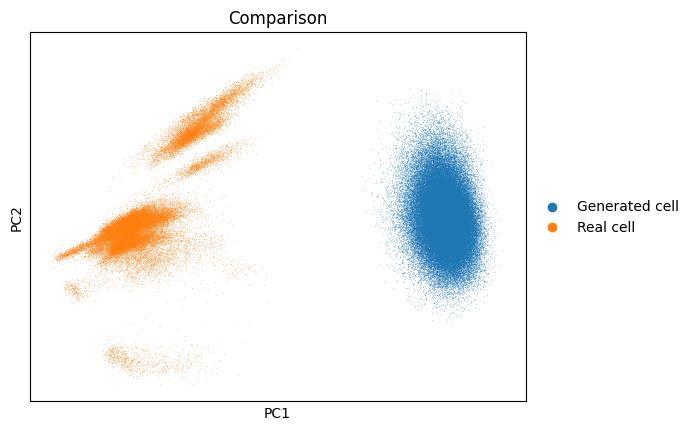

In [14]:
sc.pp.pca(adata_plot_log, n_comps=50)
sc.pl.pca(adata_plot_log, color='source', title='Comparison',show=True)

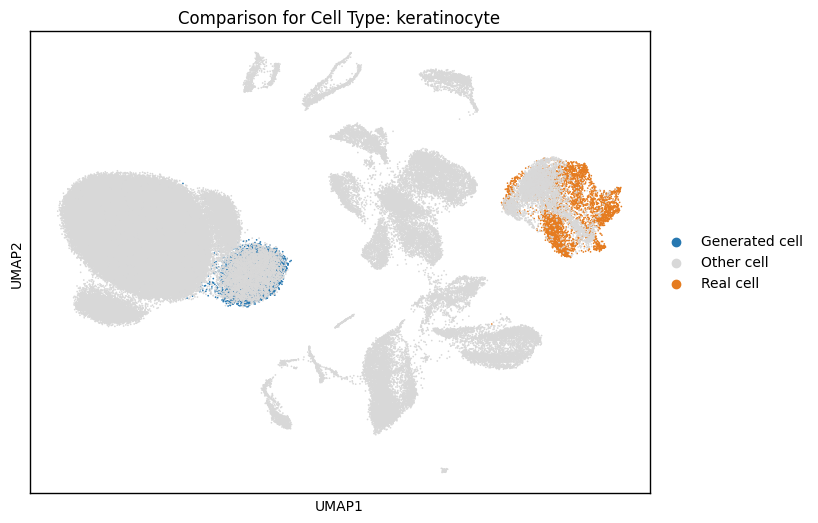

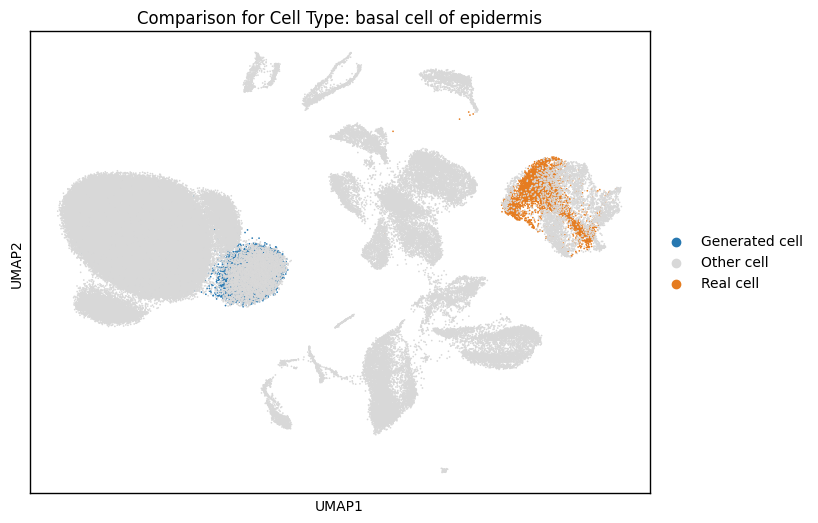

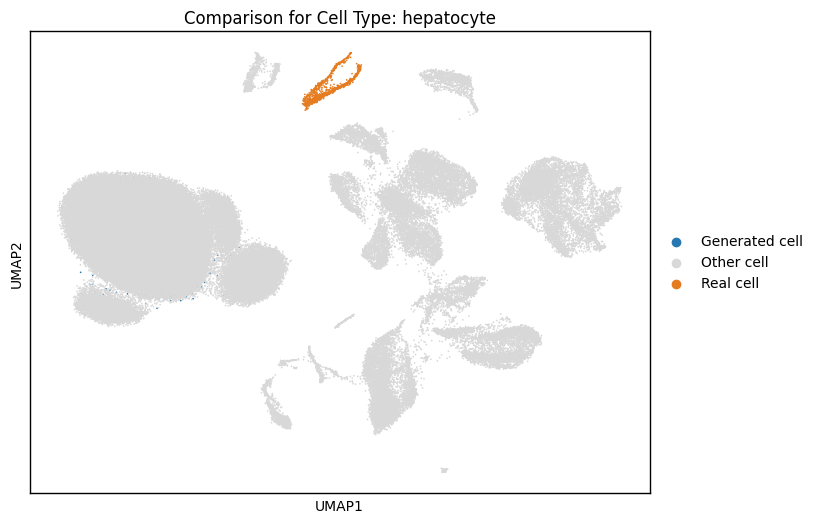

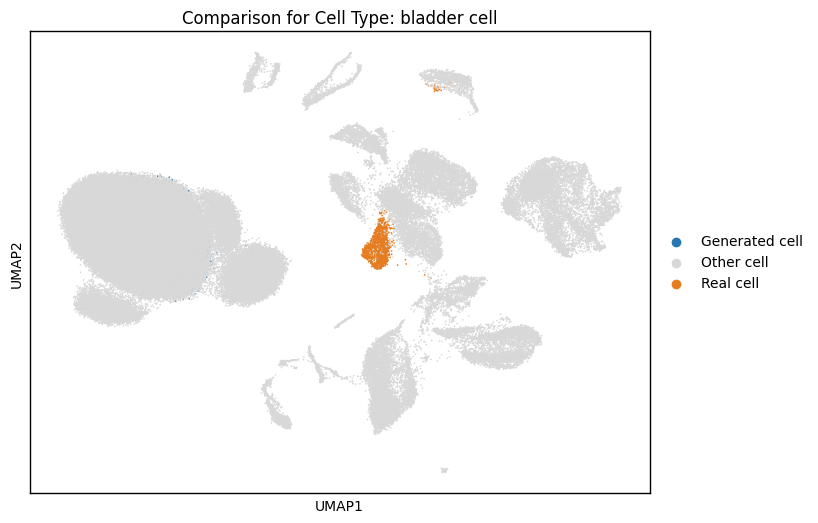

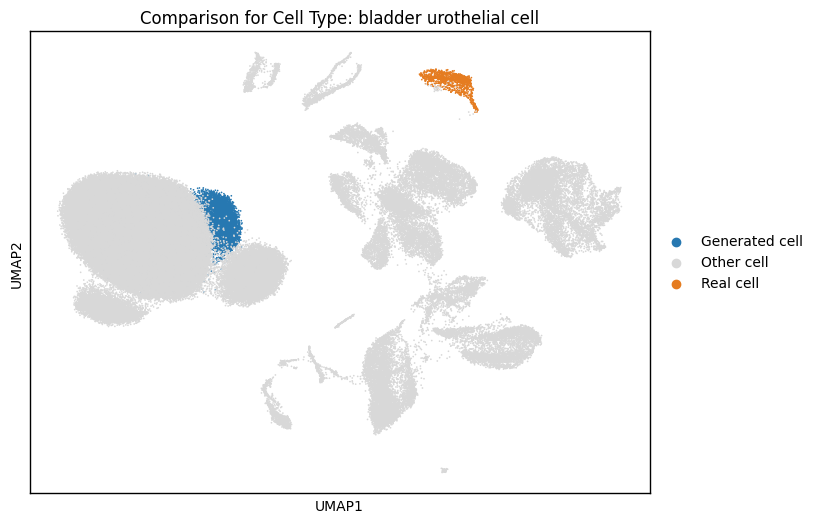

...

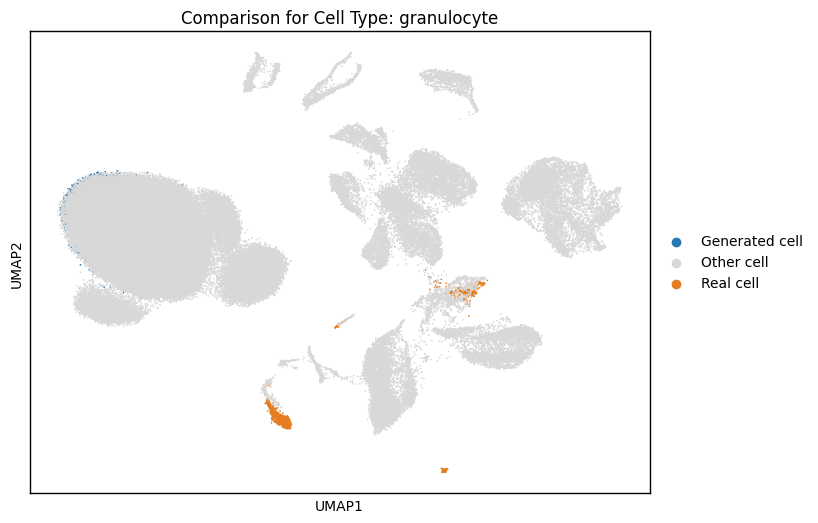

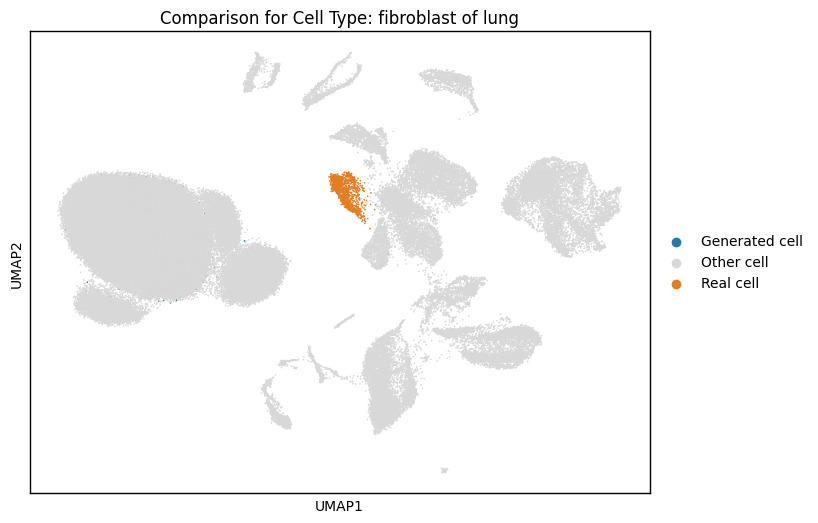

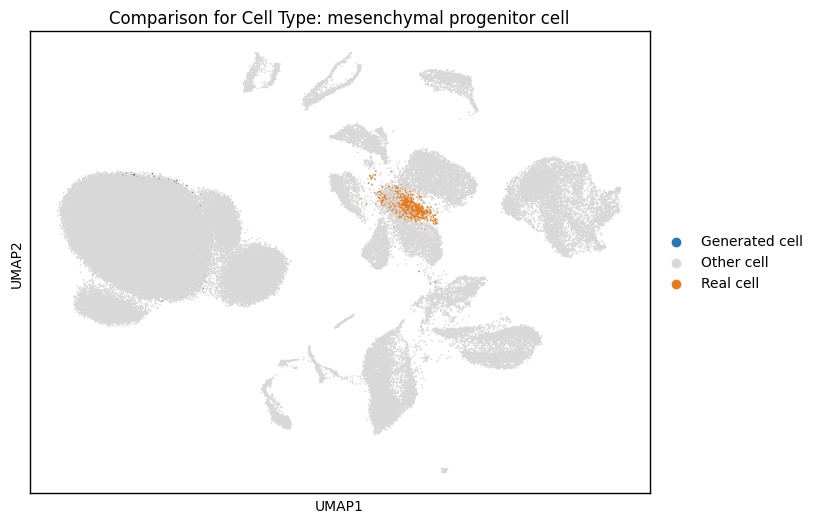

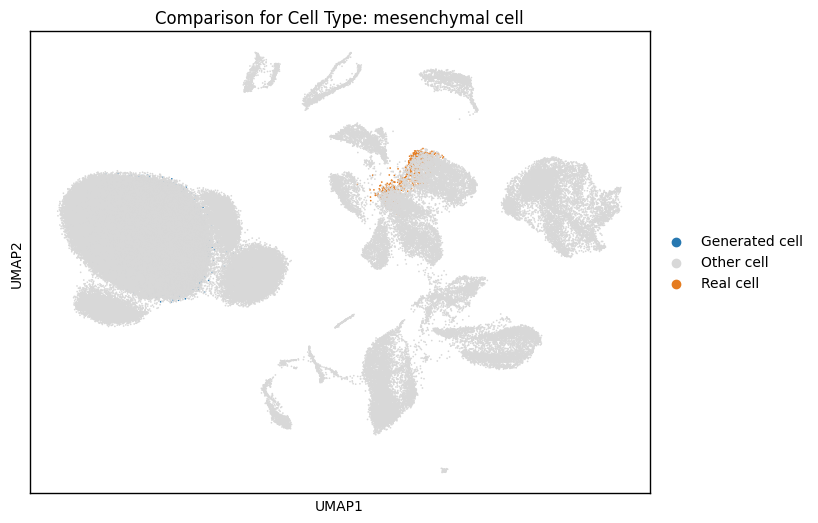

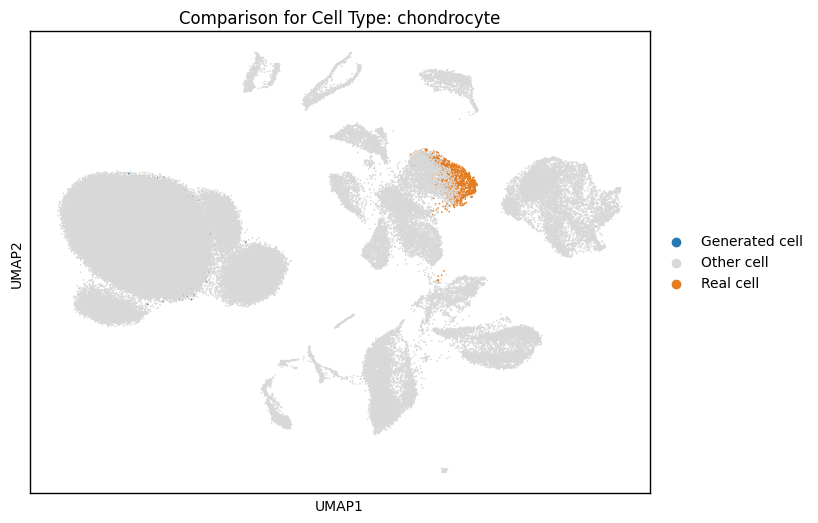

In [15]:
celltypes = adata_plot_log.obs['cell_ontology_class'].unique()
custom_palette = {
    'Real cell': '#e57c20',       
    'Generated cell': '#2778b1', 
    'Other cell': '#d8d8d8'     
}
for celltype in celltypes:
    fig, ax = plt.subplots(figsize=(8, 6))
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(1.0)
    
    
    # Filter data for the current cell type (plot only real and generated of this type)
    subset = adata_plot_log[adata_plot_log.obs['cell_ontology_class'] == celltype]
    
    # Create a mask for other cell types (all data except current cell type)
    other_cells = adata_plot_log[adata_plot_log.obs['cell_ontology_class'] != celltype].copy()
    other_cells.obs['source'] = 'Other cell'  # Label other cells as 'Other cell'
    
    # Combine the current subset (real + generated) and 'Other' cells
    combined_data = adata_plot_log[adata_plot_log.obs['cell_ontology_class'] == celltype].concatenate(other_cells)
    
    # Plot UMAP for the current cell type, highlighting real and generated cells as well as other cells in black
    sc.pl.umap(combined_data, color='source', size=6, title=f'Comparison for Cell Type: {celltype}', ax=ax,palette=custom_palette)
    
    # Show the plot
    plt.show()

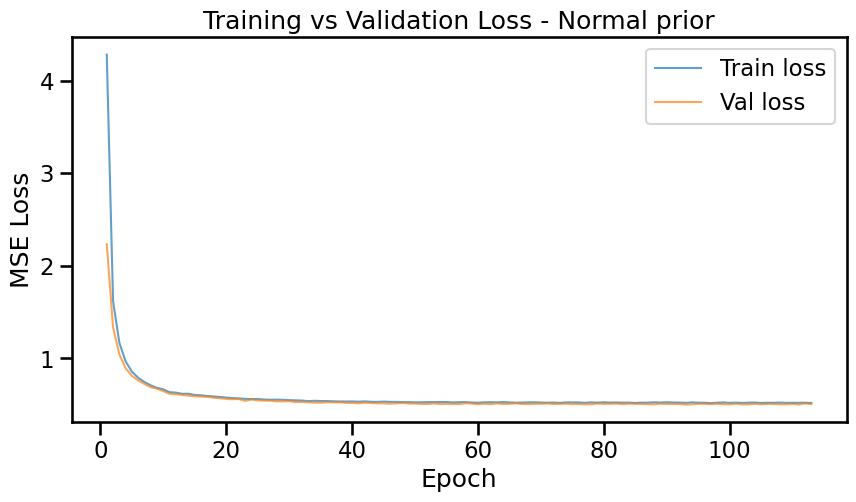

In [24]:
epochs = range(1, len(train_losses_log) + 1)


plt.figure(figsize=(10,5))

# Plot plain diffusion loop
plt.plot(epochs, train_losses_log, lw=1.5, alpha=0.7, label='Train loss')
plt.plot(epochs, val_losses_log,  lw=1.5, alpha=0.7,  label='Val loss')


plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('Training vs Validation Loss - Normal prior')
plt.legend()

plt.show()

# Plot the noise process

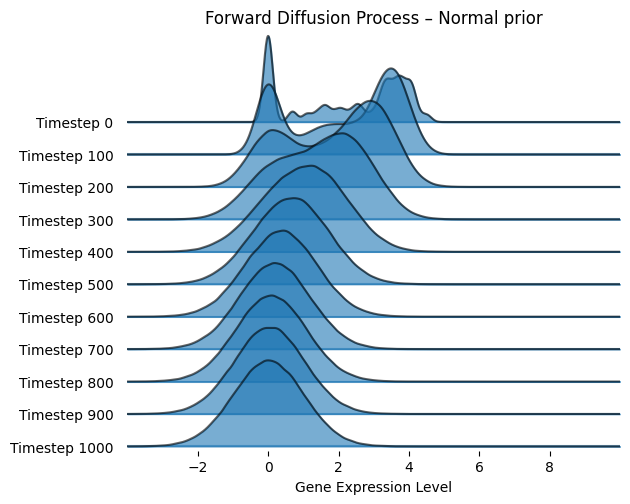

In [8]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from joypy import joyplot

X = adata_sub.X
if scipy.sparse.issparse(X):
    X = X.toarray()
x0 = torch.tensor(X[0], dtype=torch.float32)

diff = DiffusionProcess(input_dim=x0.shape[0])
n_draws   = 2000

timesteps = list(range(0, config.num_timesteps + 1, 100))   # [0,100,200,…,1000]
all_xt = []

for t in timesteps:
    # clamp to the last valid index (999)
    t_idx = min(t, config.num_timesteps - 1)
    t_tensor = torch.tensor([t_idx], dtype=torch.long)

    # sample as before
    xt_samples = []
    for _ in range(n_draws):
        x_t, _ = diff.add_noise(x0, t_tensor)
        xt_samples.append(x_t.numpy())
    all_xt.append(np.concatenate(xt_samples))

# now feed those *labels* into joyplot
fig, axes = joyplot(
    all_xt,
    labels=[f"Timestep {t}" for t in timesteps],  # now goes up to 1000
    grid=False,
    ylim='auto',
    x_range=(-4,10),
    alpha=0.6
)
plt.title('Forward Diffusion Process – Normal prior')
plt.xlabel('Gene Expression Level')
plt.ylabel('Density')
plt.show()



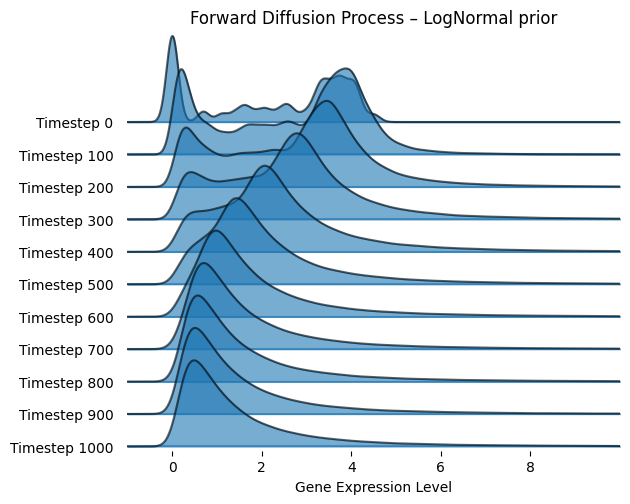

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from joypy import joyplot

X = adata_sub.X
if scipy.sparse.issparse(X):
    X = X.toarray()
x0 = torch.tensor(X[0], dtype=torch.float32)

diff = DiffusionProcessLogNormal(input_dim=x0.shape[0])
n_draws   = 2000

timesteps = list(range(0, config.num_timesteps + 1, 100))   # [0,100,200,…,1000]
all_xt = []

for t in timesteps:
    # clamp to the last valid index (999)
    t_idx = min(t, config.num_timesteps - 1)
    t_tensor = torch.tensor([t_idx], dtype=torch.long)

    # sample as before
    xt_samples = []
    for _ in range(n_draws):
        x_t, _ = diff.add_noise(x0, t_tensor)
        xt_samples.append(x_t.numpy())
    all_xt.append(np.concatenate(xt_samples))

# now feed those *labels* into joyplot
fig, axes = joyplot(
    all_xt,
    labels=[f"Timestep {t}" for t in timesteps],  # now goes up to 1000
    grid=False,
    ylim='auto',
    x_range=(-1,10),
    alpha=0.6
)
plt.title('Forward Diffusion Process – Log-normal prior')
plt.xlabel('Gene Expression Level')
plt.ylabel('Density')
plt.show()




# VAE and GMM for benchmark

In [16]:
import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.mixture import GaussianMixture

##############################################
# 1. Variational Autoencoder (VAE)
##############################################

class VAE(nn.Module):
    def __init__(self, input_dim, num_classes, latent_dim=128, hidden_dim=64):
        super().__init__()
        self.label_emb = nn.Embedding(num_classes, hidden_dim)
        # Encoder: input concatenated with label embedding
        self.encoder = nn.Sequential(
            nn.Linear(input_dim + hidden_dim, hidden_dim),
            nn.ReLU(),
        )
        self.fc_mu = nn.Linear(hidden_dim, latent_dim)
        self.fc_logvar = nn.Linear(hidden_dim, latent_dim)
        # Decoder: latent + label embedding
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim + hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, input_dim),
        )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x, y):
        y_emb = self.label_emb(y)
        h = torch.cat([x, y_emb], dim=1)
        h = self.encoder(h)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        z = self.reparameterize(mu, logvar)
        zcat = torch.cat([z, y_emb], dim=1)
        x_recon = self.decoder(zcat)
        return x_recon, mu, logvar


# Loss for VAE
def vae_loss(x_recon, x, mu, logvar):
    recon_loss = nn.functional.mse_loss(x_recon, x, reduction='mean')
    # KL divergence
    kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + kld

# Training loop for VAE
def train_vae(model, X, y, epochs=1000, lr=1e-3, batch_size=320):
    device = next(model.parameters()).device
    dataset = TensorDataset(X.to(device), y.to(device))
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    model.train()
    for epoch in range(epochs):
        total=0
        for xb, yb in loader:
            recon, mu, logvar = model(xb, yb)
            loss = vae_loss(recon, xb, mu, logvar)
            optimizer.zero_grad(); loss.backward(); optimizer.step()
            total += loss.item()
        print(f"VAE epoch {epoch+1}, loss {total/len(X):.4f}")
    return model

# Generate data from VAE
def generate_vae(model, num_samples,device='cuda'):
    model.eval()
    C = model.label_emb.num_embeddings
    D = model.decoder[-1].out_features  # final output dim

    all_samples = []
    all_labels  = []

    with torch.no_grad():
        for cls in range(C):
            # build a label‐tensor of size [num_per_class]
            y_cls = torch.full(
                (num_samples,), 
                cls, 
                dtype=torch.long, 
                device=device
            )
            # embed and sample
            y_emb = model.label_emb(y_cls)
            z     = torch.randn(num_samples, model.fc_mu.out_features, device=device)
            zin   = torch.cat([z, y_emb], dim=1)
            Xc    = model.decoder(zin)               # torch.Tensor [num_per_class, D]
            all_samples.append(Xc.cpu().numpy())
            all_labels.extend([cls] * num_samples)

    X_gen = np.vstack(all_samples)               # (C*num_per_class, D)
    y_gen = np.array(all_labels, dtype=int)      # (C*num_per_class,)
    return X_gen, y_gen

    
##############################################
# 2. Gaussian Mixture Model (GMM)
##############################################

def train_gmm(X, labels, n_components=5, covariance_type='full'):
    gmms = {}
    for cls in np.unique(labels):
        Xc = X[labels==cls]
        gmm = GaussianMixture(n_components=n_components,
                              covariance_type=covariance_type,
                              random_state=0)
        gmm.fit(Xc)
        gmms[cls] = gmm
    return gmms


# Generate from fitted GMM
def generate_gmm(gmms, labels, num_per_class):
    all_samples, all_labels = [], []
    for cls, gmm in gmms.items():
        samp, _ = gmm.sample(num_per_class)
        all_samples.append(samp)
        all_labels.extend([cls]*num_per_class)
    return np.vstack(all_samples), np.array(all_labels)

In [17]:
# Convert sparse matrix to dense
X = adata_sub.X
if scipy.sparse.issparse(X):
    X = X.toarray()

labels = adata_sub.obs['cell_ontology_class'].values
le = LabelEncoder()
labels_encoded = le.fit_transform(labels)

# parameter for config
config.input_dim = X.shape[1]
config.num_classes = len(np.unique(labels_encoded))

# Split data
X_train, X_val, y_train, y_val = train_test_split(
    X, labels_encoded,
    test_size=0.2,
    random_state=42,
    stratify=labels_encoded
)

In [18]:
from sklearn.metrics import mean_squared_error
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
Xt_train = torch.tensor(X_train, dtype=torch.float32, device=device)
yt_train = torch.tensor(y_train, dtype=torch.long, device=device)
Xt_val   = torch.tensor(X_val,   dtype=torch.float32, device=device)
yt_val   = torch.tensor(y_val,   dtype=torch.long, device=device)

# 3) Train your CVAE on the train split
vae = VAE(input_dim=X_train.shape[1], num_classes=config.num_classes).to(device)
train_vae(vae, Xt_train, yt_train, epochs=100, lr=1e-3, batch_size=config.batch_size)

# 4) Evaluate VAE reconstruction error on the *val* split
vae.eval()
with torch.no_grad():
    Xval_recon, mu_val, logvar_val = vae(Xt_val, yt_val)
mse_val = mean_squared_error(Xt_val.cpu().numpy(), Xval_recon.cpu().numpy())
print(f"VAE Val Reconstruction MSE: {mse_val:.4f}")

# 5) Generate *new* samples for each val label and compute downstream metrics
num_per_class = 1000
y_sample = torch.cat([
    torch.full((num_per_class,), cls, dtype=torch.long, device=device)
    for cls in np.unique(y_val)
])
X_vae_gen, labels_vae = generate_vae(
    model=vae, 
    num_samples=1000, 
    device=device
)

# 6) Train conditional GMMs on the *train* split
gmms = train_gmm(X_train, y_train, n_components=10)

# 7) Evaluate GMM log-likelihood on the *val* split
log_liks = []
for cls in np.unique(y_val):
    mask = (y_val == cls)
    log_liks.append(gmms[cls].score(X_val[mask]).mean())
print(f"GMM Val Avg Log-Likelihood: {np.mean(log_liks):.4f}")

# 8) Generate GMM samples for each val class
X_gmm_gen, labels_gmm = generate_gmm(gmms, y_val, num_per_class)


VAE epoch 1, loss 1.2497
VAE epoch 2, loss 0.0615
VAE epoch 3, loss 0.0119
VAE epoch 4, loss 0.0035
VAE epoch 5, loss 0.0020
VAE epoch 6, loss 0.0017
VAE epoch 7, loss 0.0016
VAE epoch 8, loss 0.0015
VAE epoch 9, loss 0.0015
VAE epoch 10, loss 0.0015
VAE epoch 11, loss 0.0015
VAE epoch 12, loss 0.0015
VAE epoch 13, loss 0.0015
VAE epoch 14, loss 0.0015
VAE epoch 15, loss 0.0015
VAE epoch 16, loss 0.0015
VAE epoch 17, loss 0.0015
VAE epoch 18, loss 0.0015
VAE epoch 19, loss 0.0015
VAE epoch 20, loss 0.0015
VAE epoch 21, loss 0.0015
VAE epoch 22, loss 0.0015
VAE epoch 23, loss 0.0015
VAE epoch 24, loss 0.0014
VAE epoch 25, loss 0.0014
VAE epoch 26, loss 0.0014
VAE epoch 27, loss 0.0014
VAE epoch 28, loss 0.0014
VAE epoch 29, loss 0.0014
VAE epoch 30, loss 0.0014
VAE epoch 31, loss 0.0014
VAE epoch 32, loss 0.0014
VAE epoch 33, loss 0.0014
VAE epoch 34, loss 0.0014
VAE epoch 35, loss 0.0014
VAE epoch 36, loss 0.0014
VAE epoch 37, loss 0.0014
VAE epoch 38, loss 0.0014
VAE epoch 39, loss 0.

GMM Val Avg Log-Likelihood: -489766.6562


In [19]:
adata_vae = sc.AnnData(X=X_vae_gen, var=adata_sub.var.copy())
adata_vae.obs['cell_ontology_class'] = pd.Categorical.from_codes(
    labels_vae,
    categories=adata_sub.obs['cell_ontology_class'].cat.categories
)
adata_vae.obs['source'] = 'VAE'

adata_gmm = sc.AnnData(X=X_gmm_gen, var=adata_sub.var.copy())
adata_gmm.obs['cell_ontology_class'] = pd.Categorical.from_codes(
    labels_gmm,
    categories=adata_sub.obs['cell_ontology_class'].cat.categories
)
adata_gmm.obs['source'] = 'GMM'


In [20]:
print("VAE evaluation")
metrics = evaluate_all(
    real_data    = adata_sub.X.toarray(),
    gen_data     = X_vae_gen,
    real_labels  = labels_encoded,
    gen_labels   = labels_vae,
    adata_real   = adata_sub,
    adata_gen    = adata_vae
)

VAE evaluation
Spearman SCC: 0.9951
MMD:          0.1663
RF AUC:       1.0000
KNN Acc:      0.8157, KNN AUC: 0.8934


In [21]:
print("GMM evaluation")
metrics = evaluate_all(
    real_data    = adata_sub.X.toarray(),
    gen_data     = X_gmm_gen,
    real_labels  = labels_encoded,
    gen_labels   = labels_gmm,
    adata_real   = adata_sub,
    adata_gen    = adata_gmm
)

GMM evaluation
Spearman SCC: 0.9990
MMD:          0.0009
RF AUC:       1.0000
KNN Acc:      0.5782, KNN AUC: 0.5161


In [22]:
classwise_energy_distance(real_data=X, generated_data=X_vae_gen, labels_encoded=labels_encoded, generated_labels=labels_vae)


Energy Distance (per class):
Class B cell: 1.6546
Class NK cell: 1.7411
Class T cell: 1.6294
Class basal cell of epidermis: 1.8635
Class bladder cell: 1.7571
Class bladder urothelial cell: 1.6968
Class chondrocyte: 1.8497
Class endothelial cell: 2.0399
Class fibroblast: 1.8651
Class fibroblast of lung: 1.7937
Class granulocyte: 2.8202
Class granulocytopoietic cell: 2.6028
Class hepatocyte: 1.8390
Class keratinocyte: 2.1462
Class kidney proximal convoluted tubule epithelial cell: 1.8712
Class macrophage: 2.3006
Class mesenchymal cell: 1.7835
Class mesenchymal progenitor cell: 1.7860
Class mesenchymal stem cell: 1.9408
Class stromal cell: 1.9326


1.9456849772726368

In [23]:
classwise_energy_distance(real_data=X, generated_data=X_gmm_gen, labels_encoded=labels_encoded, generated_labels=labels_gmm)

Energy Distance (per class):
Class B cell: 0.1143
Class NK cell: 0.1225
Class T cell: 0.1095
Class basal cell of epidermis: 0.1597
Class bladder cell: 0.1092
Class bladder urothelial cell: 0.1209
Class chondrocyte: 0.1140
Class endothelial cell: 0.1240
Class fibroblast: 0.1471
Class fibroblast of lung: 0.1020
Class granulocyte: 0.1794
Class granulocytopoietic cell: 0.1582
Class hepatocyte: 0.1049
Class keratinocyte: 0.1521
Class kidney proximal convoluted tubule epithelial cell: 0.1229
Class macrophage: 0.1830
Class mesenchymal cell: 0.1135
Class mesenchymal progenitor cell: 0.1159
Class mesenchymal stem cell: 0.1226
Class stromal cell: 0.1450


0.13102883633445842

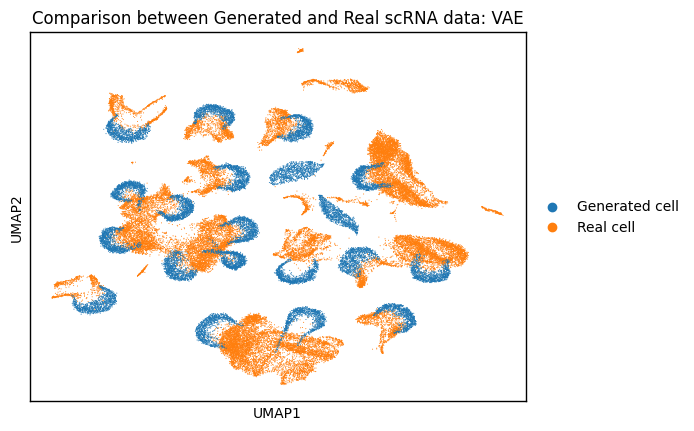

In [24]:
adata_vae = ad.AnnData(X=X_vae_gen,var=adata_sub.var.copy())
adata_vae.obs['cell_ontology_class'] = pd.Categorical.from_codes(
    labels_vae,
    categories=adata_sub.obs['cell_ontology_class'].cat.categories
)
adata_vae.obs['source'] = 'Generated cell'
adata_sub.obs['source'] = 'Real cell'

adata_plot_vae = ad.concat(
    [adata_sub,adata_vae],
    join='outer',
    label='batch',
    keys=['real','gen'])

sc.pp.pca(adata_plot_vae, n_comps=50)
sc.pp.neighbors(adata_plot_vae)
sc.tl.umap(adata_plot_vae)

fig = sc.pl.umap(
    adata_plot_vae,
    color='source',
    title='Comparison between Generated and Real scRNA data: VAE',
    show=False,
    return_fig=True
)

# grab the axis
ax = fig.axes[0]

# lighten & slim down each spine
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.0)

# (optional) adjust tick color too
# ax.tick_params(color='grey', labelcolor='grey')
plt.show()




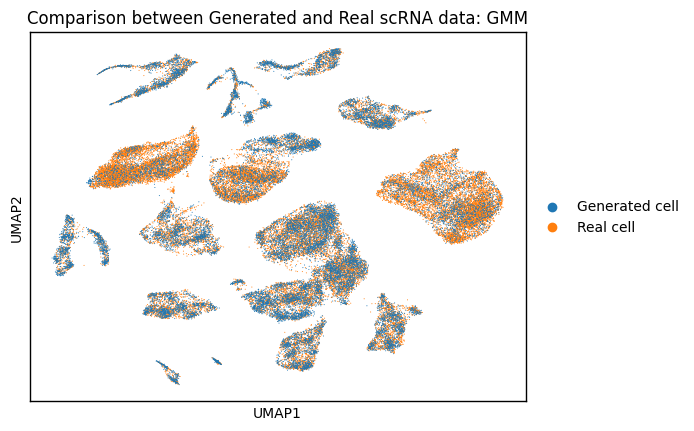

In [25]:
adata_gmm = ad.AnnData(X=X_gmm_gen,var=adata_sub.var.copy())
adata_gmm.obs['cell_ontology_class'] = pd.Categorical.from_codes(
    labels_gmm,
    categories=adata_sub.obs['cell_ontology_class'].cat.categories
)
adata_gmm.obs['source'] = 'Generated cell'
adata_sub.obs['source'] = 'Real cell'

adata_plot_gmm = ad.concat(
    [adata_sub,adata_gmm],
    join='outer',
    label='batch',
    keys=['real','gen'])

sc.pp.pca(adata_plot_gmm, n_comps=50)
sc.pp.neighbors(adata_plot_gmm)
sc.tl.umap(adata_plot_gmm)
fig = sc.pl.umap(
    adata_plot_gmm,
    color='source',
    title='Comparison between Generated and Real scRNA data: GMM',
    show=False,
    return_fig=True
)

# grab the axis
ax = fig.axes[0]

# lighten & slim down each spine
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.0)

# (optional) adjust tick color too
# ax.tick_params(color='grey', labelcolor='grey')
plt.show()

# Implement GAN for comparison

In [26]:
import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset

##############################################
# 1. Label-Conditional GAN
##############################################

class Generator(nn.Module):
    def __init__(self, latent_dim, input_dim, num_classes, label_emb_dim=64, hidden_dim=128):
        super().__init__()
        self.label_emb = nn.Embedding(num_classes, label_emb_dim)
        self.net = nn.Sequential(
            nn.Linear(latent_dim + label_emb_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, input_dim),
            # no activation: raw log1p gene space
        )

    def forward(self, z, y):
        ye = self.label_emb(y)
        x = torch.cat([z, ye], dim=1)
        return self.net(x)


class Discriminator(nn.Module):
    def __init__(self, input_dim, num_classes, label_emb_dim=64, hidden_dim=128):
        super().__init__()
        self.label_emb = nn.Embedding(num_classes, label_emb_dim)
        self.net = nn.Sequential(
            nn.Linear(input_dim + label_emb_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1),
            nn.Sigmoid(),
        )

    def forward(self, x, y):
        ye = self.label_emb(y)
        h  = torch.cat([x, ye], dim=1)
        return self.net(h)


##############################################
# 2. Training Loop
##############################################

def train_gan(
    gen: Generator,
    dis: Discriminator,
    X_train: torch.Tensor,
    y_train: torch.Tensor,
    latent_dim: int,
    epochs=100,
    batch_size=320,
    lr=2e-4,
    device='cuda'
):
    gen.to(device); dis.to(device)
    opt_g = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5,0.999))
    opt_d = torch.optim.Adam(dis.parameters(), lr=lr, betas=(0.5,0.999))
    loader = DataLoader(TensorDataset(X_train, y_train),
                        batch_size=batch_size, shuffle=True)
    criterion = nn.BCELoss()

    for epoch in range(epochs):
        g_loss_accum = 0.0
        d_loss_accum = 0.0
        for real_x, real_y in loader:
            real_x, real_y = real_x.to(device), real_y.to(device)
            bsz = real_x.size(0)

            # 1) Train Discriminator
            # Real
            real_lbl = torch.ones(bsz,1,device=device)*0.1 + 0.9
            pred_real = dis(real_x, real_y)
            loss_real = criterion(pred_real, real_lbl)

            # Fake
            z = torch.randn(bsz, latent_dim, device=device)
            fake_x = gen(z, real_y)
            fake_lbl = torch.zeros(bsz,1,device=device)*0.1 
            pred_fake = dis(fake_x.detach(), real_y)
            loss_fake = criterion(pred_fake, fake_lbl)

            loss_d = (loss_real + loss_fake) * 0.5
            opt_d.zero_grad(); loss_d.backward(); opt_d.step()
            d_loss_accum += loss_d.item()

            # 2) Train Generator
            pred_fake_for_g = dis(fake_x, real_y)
            loss_g = criterion(pred_fake_for_g, real_lbl)  # wants D(fake)=1
            opt_g.zero_grad(); loss_g.backward(); opt_g.step()
            g_loss_accum += loss_g.item()

        print(f"Epoch {epoch+1}: D_loss={d_loss_accum/len(loader):.4f}, G_loss={g_loss_accum/len(loader):.4f}")

    return gen, dis


##############################################
# 3. Sampling Function
##############################################

def generate_gan(gen: Generator, num_per_class: int, num_classes: int, latent_dim: int, device='cuda'):
    gen.eval()
    all_samples = []
    all_labels  = []
    with torch.no_grad():
        for cls in range(num_classes):
            z = torch.randn(num_per_class, latent_dim, device=device)
            y = torch.full((num_per_class,), cls, dtype=torch.long, device=device)
            x_gen = gen(z, y)
            all_samples.append(x_gen.cpu().numpy())
            all_labels.extend([cls]*num_per_class)

    X_gen = np.vstack(all_samples)
    y_gen = np.array(all_labels, dtype=int)
    return X_gen, y_gen


In [32]:
# Convert sparse matrix to dense
X = adata_sub.X
if scipy.sparse.issparse(X):
    X = X.toarray()

labels = adata_sub.obs['cell_ontology_class'].values
le = LabelEncoder()
labels_encoded = le.fit_transform(labels)

# parameter for config
config.input_dim = X.shape[1]
config.num_classes = len(np.unique(labels_encoded))

# Split data
X_train, X_val, y_train, y_val = train_test_split(
    X, labels_encoded,
    test_size=0.2,
    random_state=42,
    stratify=labels_encoded
)

In [27]:
device = config.device
Xt = torch.tensor(X_train, dtype=torch.float32).to(device)
yt = torch.tensor(y_train, dtype=torch.long).to(device)

latent_dim = 128
gen = Generator(latent_dim, config.input_dim, config.num_classes)
dis = Discriminator(config.input_dim, config.num_classes)
gen, dis = train_gan(gen, dis, Xt, yt, latent_dim,
                     epochs=1000, batch_size=config.batch_size, lr=1e-4, device=device)


Epoch 1: D_loss=0.4592, G_loss=0.7613
Epoch 2: D_loss=0.5232, G_loss=0.8806
Epoch 3: D_loss=0.6280, G_loss=0.9933
Epoch 4: D_loss=0.4741, G_loss=1.0954
Epoch 5: D_loss=0.5066, G_loss=1.0011
Epoch 6: D_loss=0.4179, G_loss=1.2294
Epoch 7: D_loss=0.5812, G_loss=1.0383
Epoch 8: D_loss=0.5382, G_loss=1.1563
Epoch 9: D_loss=0.5285, G_loss=1.1174
Epoch 10: D_loss=0.5346, G_loss=1.0025
Epoch 11: D_loss=0.5478, G_loss=1.0791
Epoch 12: D_loss=0.5627, G_loss=1.0397
Epoch 13: D_loss=0.5459, G_loss=1.0888
Epoch 14: D_loss=0.5416, G_loss=1.0454
Epoch 15: D_loss=0.5484, G_loss=1.0754
Epoch 16: D_loss=0.5685, G_loss=1.0376
Epoch 17: D_loss=0.5911, G_loss=1.0226
Epoch 18: D_loss=0.5654, G_loss=1.0185
Epoch 19: D_loss=0.5869, G_loss=1.0230
Epoch 20: D_loss=0.5632, G_loss=0.9823
Epoch 21: D_loss=0.5900, G_loss=0.9911
Epoch 22: D_loss=0.5801, G_loss=0.9835
Epoch 23: D_loss=0.5673, G_loss=0.9924
Epoch 24: D_loss=0.5686, G_loss=1.0048
Epoch 25: D_loss=0.5692, G_loss=1.0020
Epoch 26: D_loss=0.5924, G_loss=1.

Epoch 180: D_loss=0.6667, G_loss=0.8031
Epoch 181: D_loss=0.6601, G_loss=0.7956
Epoch 182: D_loss=0.6582, G_loss=0.7926
Epoch 183: D_loss=0.6631, G_loss=0.7734
Epoch 184: D_loss=0.6536, G_loss=0.7854
Epoch 185: D_loss=0.6732, G_loss=0.7830
Epoch 186: D_loss=0.6546, G_loss=0.7836
Epoch 187: D_loss=0.6613, G_loss=0.7818
Epoch 188: D_loss=0.6580, G_loss=0.7891
Epoch 189: D_loss=0.6771, G_loss=0.7873
Epoch 190: D_loss=0.6673, G_loss=0.7713
Epoch 191: D_loss=0.6674, G_loss=0.7750
Epoch 192: D_loss=0.6654, G_loss=0.7822
Epoch 193: D_loss=0.6526, G_loss=0.7693
Epoch 194: D_loss=0.6577, G_loss=0.7838
Epoch 195: D_loss=0.6683, G_loss=0.7573
Epoch 196: D_loss=0.6596, G_loss=0.7744
Epoch 197: D_loss=0.6553, G_loss=0.7808
Epoch 198: D_loss=0.6635, G_loss=0.7726
Epoch 199: D_loss=0.6552, G_loss=0.7935
Epoch 200: D_loss=0.6552, G_loss=0.7759
Epoch 201: D_loss=0.6625, G_loss=0.7844
Epoch 202: D_loss=0.6544, G_loss=0.7808
Epoch 203: D_loss=0.6528, G_loss=0.7898
Epoch 204: D_loss=0.6575, G_loss=0.7985


In [29]:
X_gan_gen, labels_gan = generate_gan(gen, num_per_class=1000,
                                     num_classes=config.num_classes,
                                     latent_dim=latent_dim,
                                     device=device)

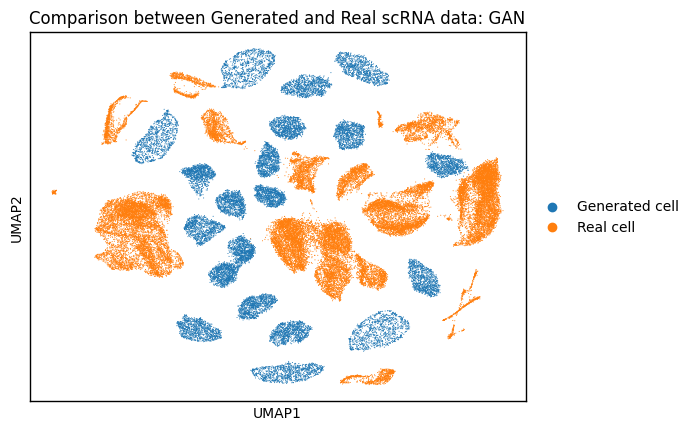

In [30]:
adata_gan = ad.AnnData(X=X_gan_gen,var=adata_sub.var.copy())
adata_gan.obs['cell_ontology_class'] = pd.Categorical.from_codes(
    labels_gan,
    categories=adata_sub.obs['cell_ontology_class'].cat.categories
)
adata_gan.obs['source'] = 'Generated cell'
adata_sub.obs['source'] = 'Real cell'

adata_plot_gan = ad.concat(
    [adata_sub,adata_gan],
    join='outer',
    label='batch',
    keys=['real','gen'])

sc.pp.pca(adata_plot_gan, n_comps=50)
sc.pp.neighbors(adata_plot_gan)
sc.tl.umap(adata_plot_gan)

fig = sc.pl.umap(
    adata_plot_gan,
    color='source',
    title='Comparison between Generated and Real scRNA data: GAN',
    show=False,
    return_fig=True
)

# grab the axis
ax = fig.axes[0]

# lighten & slim down each spine
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.0)

# (optional) adjust tick color too
# ax.tick_params(color='grey', labelcolor='grey')
plt.show()

In [31]:
classwise_energy_distance(real_data=X, generated_data=X_gan_gen, labels_encoded=labels_encoded, generated_labels=labels_gan)


Energy Distance (per class):
Class B cell: 1.0568
Class NK cell: 1.9041
Class T cell: 1.2537
Class basal cell of epidermis: 1.4184
Class bladder cell: 1.7207
Class bladder urothelial cell: 2.0490
Class chondrocyte: 1.4151
Class endothelial cell: 1.3266
Class fibroblast: 1.4546
Class fibroblast of lung: 1.6406
Class granulocyte: 3.2492
Class granulocytopoietic cell: 2.5963
Class hepatocyte: 1.5490
Class keratinocyte: 1.4442
Class kidney proximal convoluted tubule epithelial cell: 1.7537
Class macrophage: 2.6286
Class mesenchymal cell: 1.2238
Class mesenchymal progenitor cell: 1.3594
Class mesenchymal stem cell: 1.5841
Class stromal cell: 2.1365


1.7382262852899952

In [32]:
metrics_gan = evaluate_all(
    real_data    = adata_sub.X.toarray(),
    gen_data     = X_gan_gen,
    real_labels  = labels_encoded,
    gen_labels   = labels_gan,
    adata_real   = adata_sub,
    adata_gen    = adata_gan
)

Spearman SCC: 0.9083
MMD:          0.2076
RF AUC:       1.0000
KNN Acc:      0.9903, KNN AUC: 0.9985


# Training for student-t distribution

In [34]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np

##############################################
# 1. CONFIGURATION 
##############################################

class Config:
    # Data params
    batch_size = 320
    num_timesteps = 1000
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Model params
    input_dim = None  # set after loading data
    num_classes = None  # set after encoding labels
    hidden_dim = 512
    time_emb_dim = 128
    label_emb_dim = 128
    num_res_blocks = 6
    lr = 1e-3
    max_epochs = 1000

    # Early stopping
    patience = 20

    # Sampling params for Student-t prior
    student_prior_df    = 15     # degrees of freedom: 15 work best
    student_prior_loc   = 0.0   # center
    student_prior_scale = 1.0   # scale (analogous to σ)
    clip_std            = 4.0   # how many σ to clamp extremes by

    # Noise scheduler
    schedule_type = 'linear'

config = Config()


##############################################
# 3. MODEL IMPLEMENTATION (unchanged)
##############################################
# … your SinusoidalPosEmb, ResidualBlock, DenseBatchNorm, StableDiffusion, etc. …


##############################################
# 4. DIFFUSION PROCESS WITH STUDENT-T PRIOR
##############################################

class DiffusionProcessStudentT:
    def __init__(
        self,
        input_dim,
        num_timesteps=1000,
        beta_start=1e-5,
        beta_end=0.02,
        schedule_type=config.schedule_type,
        df=config.student_prior_df,
        loc=config.student_prior_loc,
        scale=config.student_prior_scale,
        clip_std=config.clip_std
    ):
        # schedule exactly as before
        self.input_dim = input_dim
        self.num_timesteps = num_timesteps

        if schedule_type == 'linear':
            beta = torch.linspace(beta_start, beta_end, num_timesteps)
        elif schedule_type == 'cosine':
            beta = self._cosine_schedule(num_timesteps)
        else:
            raise ValueError("Unsupported schedule type. Use 'linear' or 'cosine'.")

        self.beta = beta
        self.alpha = 1 - beta
        self.alpha_bar = torch.cumprod(self.alpha, dim=0)

        # set up Student-t
        self.studentt = torch.distributions.StudentT(df, loc=loc, scale=scale)
        self.clip_std = clip_std

    def _cosine_schedule(self, num_timesteps, s=0.008):
        steps = torch.arange(num_timesteps + 1) / num_timesteps
        alpha_bar = torch.cos((steps + s) / (1 + s) * torch.pi * 0.5) ** 2
        alpha_bar = alpha_bar / alpha_bar[0]
        alpha_bar[-1] = 0.0
        beta = 1 - alpha_bar[1:] / alpha_bar[:-1]
        return torch.clamp(beta, 1e-4, 0.9999)

    def add_noise(self, x, t):
        """
        x: clean data (in linear space)
        t: timestep index
        returns noisy_x, noise
        """
        # sample heavy-tailed noise
        noise = self.studentt.sample(x.shape).to(x.device)
        # clamp extreme tails
        # mean = self.studentt.mean.to(x.device)
        # std  = self.studentt.stddev.to(x.device)
        # noise = torch.clamp(noise,
        #                     mean - self.clip_std * std,
        #                     mean + self.clip_std * std)

        # standard diffusion mixing
        alpha_bar_t = self.alpha_bar[t].view(-1, *([1] * (x.dim()-1)))
        noisy_x = torch.sqrt(alpha_bar_t) * x + torch.sqrt(1 - alpha_bar_t) * noise
        return noisy_x, noise


##############################################
# 5. DATASET FOR STUDENT-T DIFFUSION
##############################################

class DiffusionDatasetStudentT(Dataset):
    def __init__(self, X, labels, diffusion, num_timesteps):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.long)
        self.diffusion = diffusion
        self.num_timesteps = num_timesteps

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        x = self.X[idx]
        t = torch.randint(0, self.num_timesteps, ()).long()
        label = self.labels[idx]
        x_noisy, noise = self.diffusion.add_noise(x, t)
        return (x_noisy, t, label), noise

def prepare_dataset_studentt(X, labels, diffusion, batch_size, num_timesteps=1000):
    dataset = DiffusionDatasetStudentT(X, labels, diffusion, num_timesteps)
    return DataLoader(dataset,
                      batch_size=batch_size,
                      shuffle=True,
                      pin_memory=True)


##############################################
# 6. SAMPLING WITH STUDENT-T PRIOR
##############################################

def sample_studentt(model, diffusion, labels, num_samples, device='cuda'):
    """
    Start from a Student-t prior instead of Gaussian.
    """
    # initial draws from Student-t
    studentt = torch.distributions.StudentT(
        config.student_prior_df,
        loc=config.student_prior_loc,
        scale=config.student_prior_scale
    )
    samples = studentt.sample((num_samples, diffusion.input_dim)).to(device)

    for t in reversed(range(diffusion.num_timesteps)):
        timestep = torch.full((num_samples,), t, dtype=torch.long, device=device)

        # predict residual
        pred_noise = torch.zeros_like(samples)
        model.eval()
        with torch.no_grad():
            pred_noise = model(samples, timestep, labels)

        # diffusion update
        alpha_bar_t    = diffusion.alpha_bar[t].to(device)
        alpha_bar_prev = diffusion.alpha_bar[t-1].to(device) if t > 0 else torch.tensor(1.0, device=device)
        alpha_t        = alpha_bar_t / alpha_bar_prev
        coef           = diffusion.beta[t].to(device) / torch.sqrt(1 - alpha_bar_t)

        samples = (samples - coef * pred_noise) / torch.sqrt(alpha_t)
        if t > 0:
            # Gaussian noise for the reverse process
            noise = torch.randn_like(samples)
            samples += torch.sqrt(diffusion.beta[t].to(device)) * noise

    return samples.cpu().numpy()

def generate_synthetic_data_studentt(
    model,
    diffusion,
    labels_encoded: np.ndarray,
    num_samples_per_class: int,
    device: str = 'cuda'
):
    """
    For each class in labels_encoded, generate `num_samples_per_class`
    by running the reverse diffusion from a Student-t prior.
    Returns:
      generated_data: np.ndarray [N_total x input_dim]
      generated_labels: np.ndarray [N_total]
    """
    model.eval()
    unique_labels = np.unique(labels_encoded)
    all_samples = []
    all_labels  = []

    for cls in unique_labels:
        # create a tensor of this class label
        label_tensor = torch.full(
            (num_samples_per_class,),
            cls,
            dtype=torch.long,
            device=device
        )
        # sample
        samples = sample_studentt(
            model,
            diffusion,
            label_tensor,
            num_samples_per_class,
            device=device
        )  # returns numpy array [num_samples_per_class x input_dim]
        all_samples.append(samples)
        all_labels.extend([cls] * num_samples_per_class)

    generated_data   = np.vstack(all_samples)
    generated_labels = np.array(all_labels, dtype=int)
    return generated_data, generated_labels


In [35]:
# Convert sparse matrix to dense
X = adata_sub.X
if scipy.sparse.issparse(X):
    X = X.toarray()

labels = adata_sub.obs['cell_ontology_class'].values
le = LabelEncoder()
labels_encoded = le.fit_transform(labels)

# parameter for config
config.input_dim = X.shape[1]
config.num_classes = len(np.unique(labels_encoded))

# Split data
X_train, X_val, y_train, y_val = train_test_split(
    X, labels_encoded,
    test_size=0.2,
    random_state=42,
    stratify=labels_encoded
)

In [36]:
if __name__ == "__main__":
    # Initialize diffusion process (normal prior)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    diffusion = DiffusionProcessStudentT(config.input_dim,
                                 num_timesteps=config.num_timesteps,
                                 schedule_type='linear')
    train_loader = prepare_dataset_studentt(X_train, y_train, diffusion, batch_size=config.batch_size)
    val_loader   = prepare_dataset_studentt(X_val,   y_val,   diffusion, batch_size=config.batch_size)

    # Initialize model
    model = StableDiffusion(
        input_dim=config.input_dim,
        num_classes=config.num_classes,
        hidden_dim=config.hidden_dim,
        time_emb_dim=config.time_emb_dim,
        label_emb_dim=config.label_emb_dim,
        num_res_blocks=config.num_res_blocks
    ).to(config.device)

    # Train with normal prior data preparation
    train_losses, val_losses = train_loop(config=config,
                                            model=model,
                                            train_loader=train_loader,
                                            val_loader=val_loader)

    # Save the trained model weights
    torch.save(model.state_dict(), './weight_rare/stable_diffusion_student_prior.pth')
    print("Model trained and saved with student prior.")

    # Load your trained model weights (normal prior model)
    model.load_state_dict(torch.load('./weight_rare/stable_diffusion_student_prior.pth', map_location=device))
    model.eval()

    # Generate synthetic data per class
    num_samples_per_class = 5000
    generated_data_student, generated_labels_student = generate_synthetic_data_studentt(model, diffusion, labels_encoded, num_samples_per_class, device)



Epoch 1/1000 - Train Loss: 0.932689 - Val Loss: 0.482435
Epoch 2/1000 - Train Loss: 0.367574 - Val Loss: 0.328700
Epoch 3/1000 - Train Loss: 0.285065 - Val Loss: 0.286932
Epoch 4/1000 - Train Loss: 0.261953 - Val Loss: 0.265324
Epoch 5/1000 - Train Loss: 0.247329 - Val Loss: 0.262214
Epoch 6/1000 - Train Loss: 0.237796 - Val Loss: 0.259794
Epoch 7/1000 - Train Loss: 0.236171 - Val Loss: 0.271469
Epoch 8/1000 - Train Loss: 0.225076 - Val Loss: 0.243911
Epoch 9/1000 - Train Loss: 0.220197 - Val Loss: 0.242932
Epoch 10/1000 - Train Loss: 0.219724 - Val Loss: 0.238366
Epoch 11/1000 - Train Loss: 0.204485 - Val Loss: 0.206998
Epoch 12/1000 - Train Loss: 0.203527 - Val Loss: 0.216562
Epoch 13/1000 - Train Loss: 0.201556 - Val Loss: 0.217963
Epoch 14/1000 - Train Loss: 0.201877 - Val Loss: 0.220372
Epoch 15/1000 - Train Loss: 0.202527 - Val Loss: 0.220743
Epoch 16/1000 - Train Loss: 0.199720 - Val Loss: 0.226941
Epoch 17/1000 - Train Loss: 0.200132 - Val Loss: 0.205442
Epoch 18/1000 - Train L

In [37]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
diffusion = DiffusionProcessStudentT(config.input_dim,
                                 num_timesteps=config.num_timesteps,
                                 schedule_type='linear')
model = StableDiffusion(
        input_dim=config.input_dim,
        num_classes=config.num_classes,
        hidden_dim=config.hidden_dim,
        time_emb_dim=config.time_emb_dim,
        label_emb_dim=config.label_emb_dim,
        num_res_blocks=config.num_res_blocks
    ).to(config.device)
# Load your trained model weights (normal prior model)
model.load_state_dict(torch.load('./weight_rare/stable_diffusion_student_prior.pth', map_location=device))
model.eval()

# Generate synthetic data per class
num_samples_per_class = 5000
generated_data_student, generated_labels_student = generate_synthetic_data_studentt(model, diffusion, labels_encoded, num_samples_per_class, device)

In [38]:
classwise_energy_distance(real_data=X, generated_data=generated_data_student, labels_encoded=labels_encoded, generated_labels=generated_labels_student)


Energy Distance (per class):
Class B cell: 0.1677
Class NK cell: 0.2701
Class T cell: 0.1908
Class basal cell of epidermis: 0.2039
Class bladder cell: 0.2113
Class bladder urothelial cell: 0.2441
Class chondrocyte: 0.1797
Class endothelial cell: 0.2461
Class fibroblast: 0.1824
Class fibroblast of lung: 0.2089
Class granulocyte: 1.0192
Class granulocytopoietic cell: 0.8082
Class hepatocyte: 0.2348
Class keratinocyte: 0.2830
Class kidney proximal convoluted tubule epithelial cell: 0.2379
Class macrophage: 0.4463
Class mesenchymal cell: 0.3305
Class mesenchymal progenitor cell: 0.1628
Class mesenchymal stem cell: 0.2200


Class stromal cell: 0.3390


0.30934910211618594

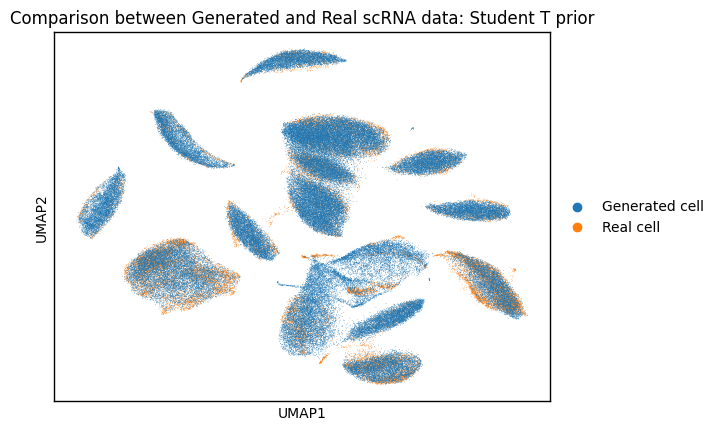

In [39]:
adata_student = ad.AnnData(X=generated_data_student,var=adata_sub.var.copy())
adata_student.obs['cell_ontology_class'] = pd.Categorical.from_codes(
    generated_labels_student,
    categories=adata_sub.obs['cell_ontology_class'].cat.categories
)
adata_student.obs['source'] = 'Generated cell'
adata_sub.obs['source'] = 'Real cell'

adata_plot_student = ad.concat(
    [adata_sub,adata_student],
    join='outer',
    label='batch',
    keys=['real','gen'])

sc.pp.pca(adata_plot_student, n_comps=50)
sc.pp.neighbors(adata_plot_student)
sc.tl.umap(adata_plot_student)

fig = sc.pl.umap(
    adata_plot_student,
    color='source',
    title='Comparison between Generated and Real scRNA data: Student T prior',
    show=False,
    return_fig=True
)

# grab the axis
ax = fig.axes[0]

# lighten & slim down each spine
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.0)

# (optional) adjust tick color too
# ax.tick_params(color='grey', labelcolor='grey')
plt.show()




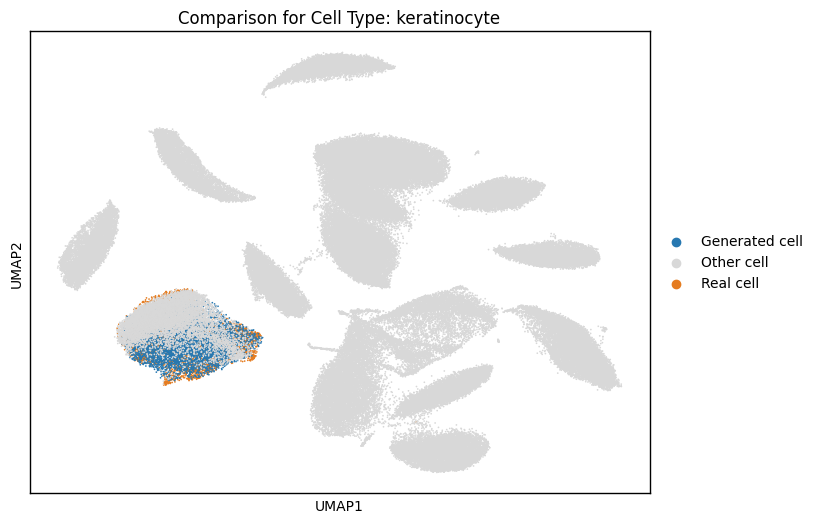

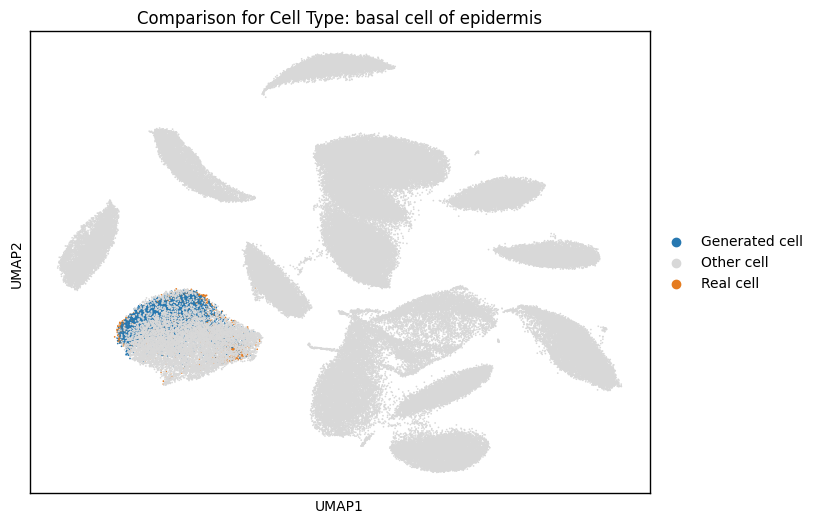

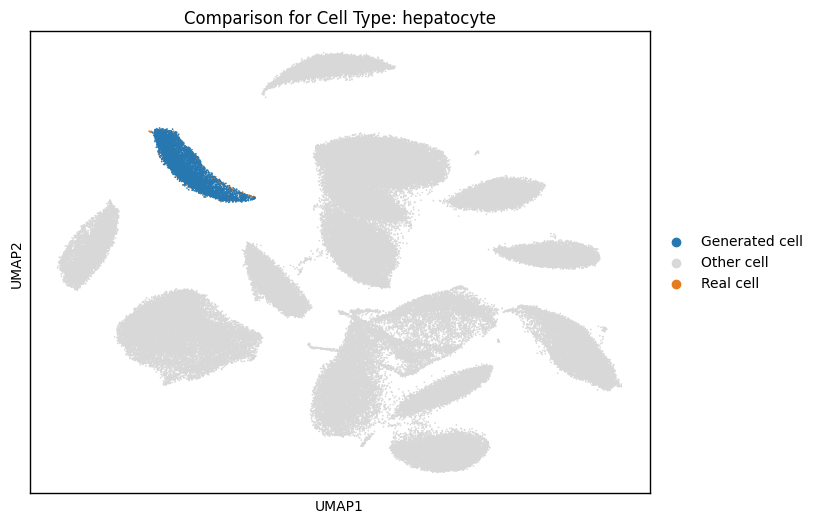

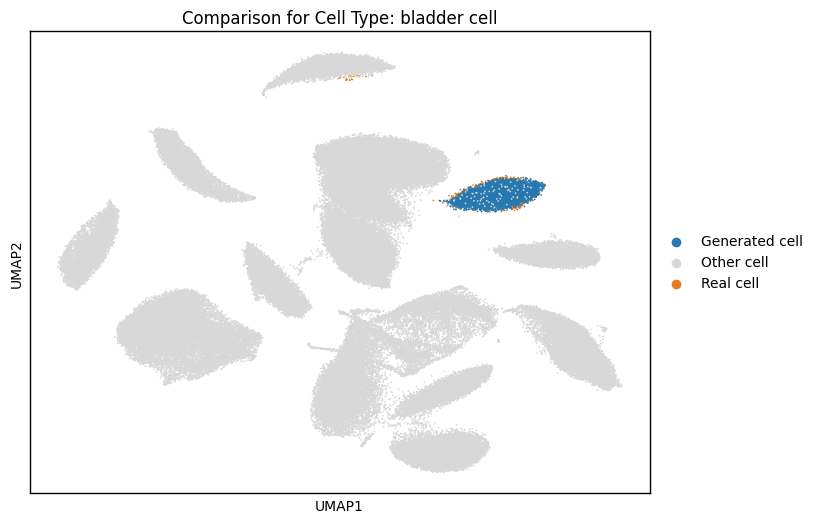

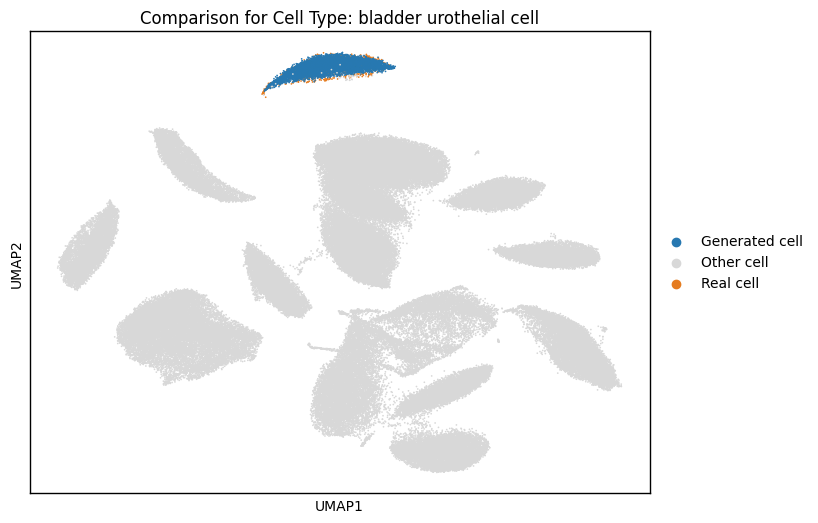

...

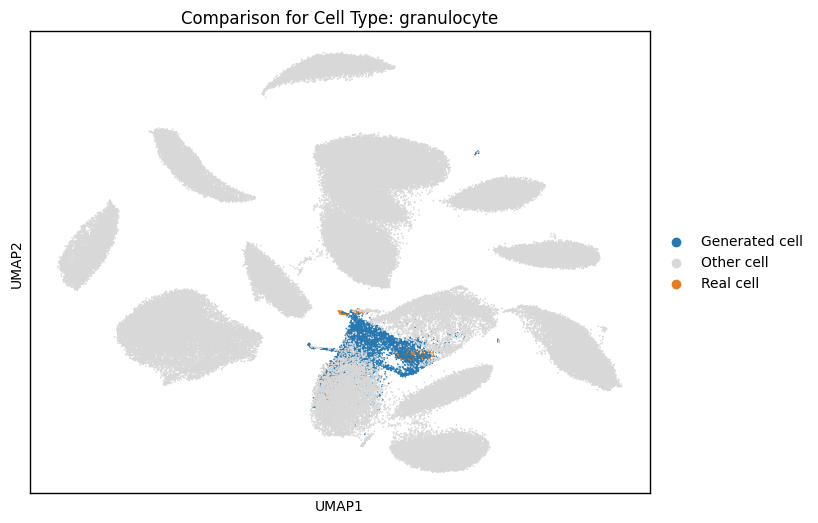

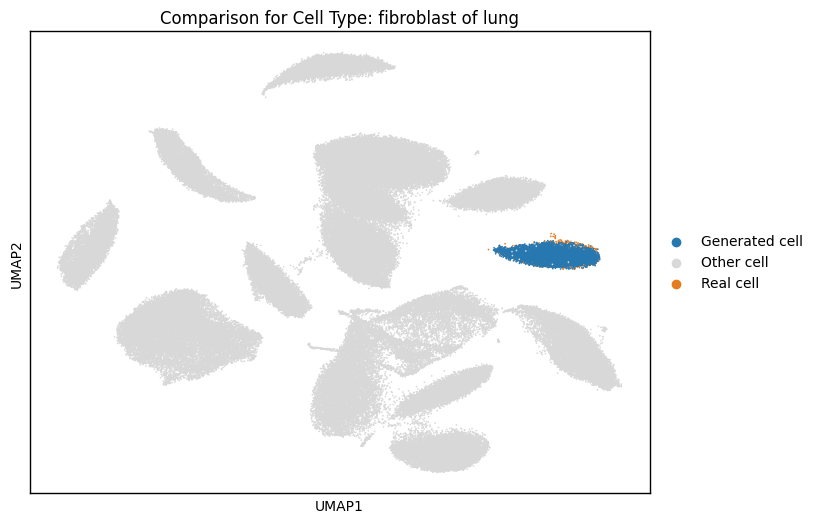

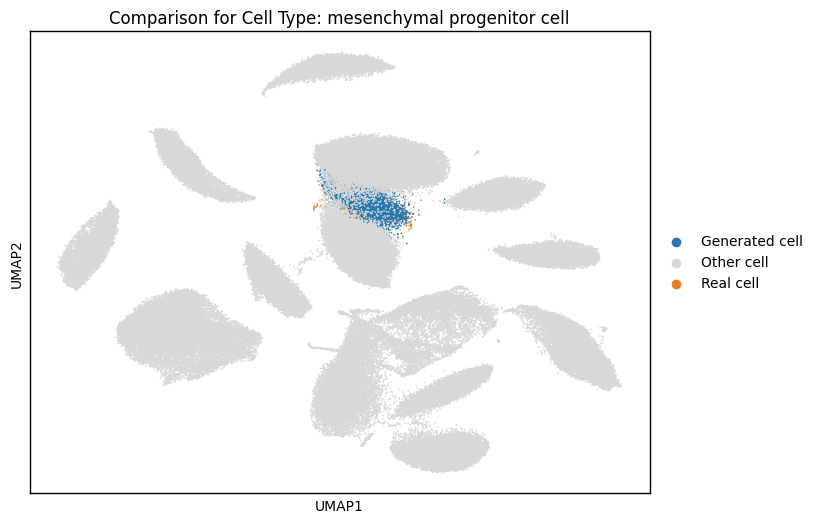

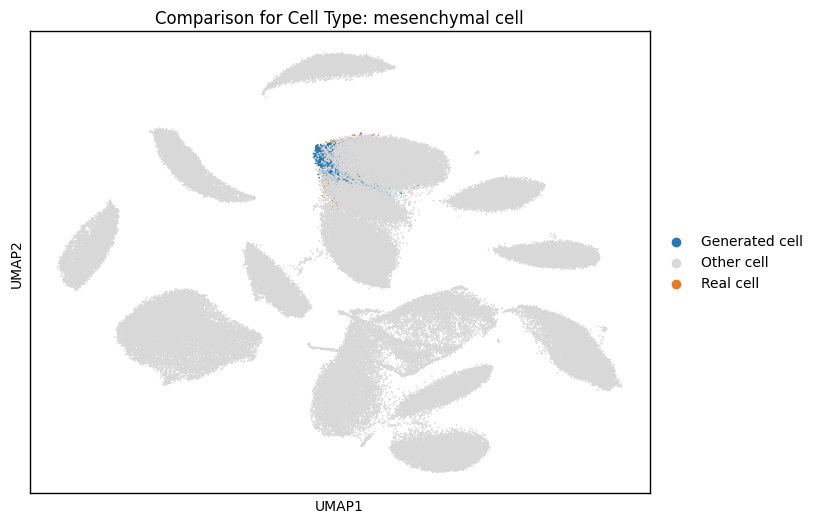

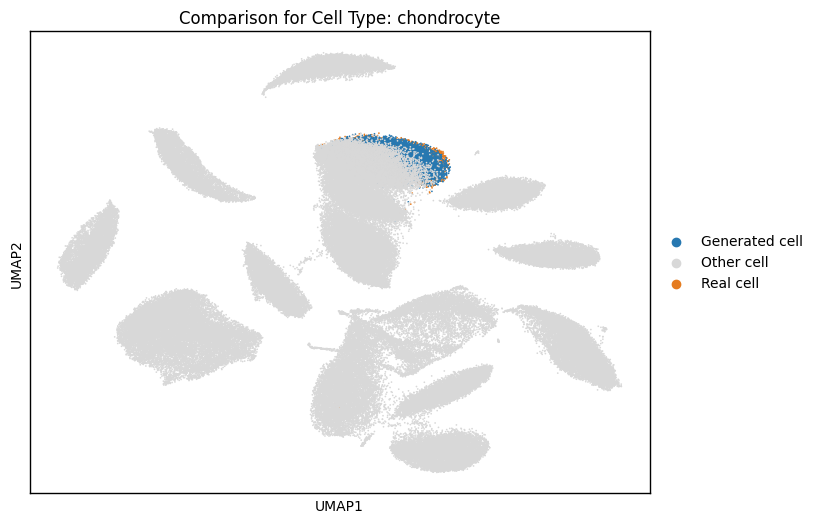

In [40]:
celltypes = adata_plot_student.obs['cell_ontology_class'].unique()
custom_palette = {
    'Real cell': '#e57c20',       
    'Generated cell': '#2778b1', 
    'Other cell': '#d8d8d8'     
}
for celltype in celltypes:
    fig, ax = plt.subplots(figsize=(8, 6))
    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(1.0)
    
    # Filter data for the current cell type (plot only real and generated of this type)
    subset = adata_plot_student[adata_plot_student.obs['cell_ontology_class'] == celltype]
    
    # Create a mask for other cell types (all data except current cell type)
    other_cells = adata_plot_student[adata_plot_student.obs['cell_ontology_class'] != celltype].copy()
    other_cells.obs['source'] = 'Other cell'  # Label other cells as 'Other cell'
    
    # Combine the current subset (real + generated) and 'Other' cells
    combined_data = adata_plot_student[adata_plot_student.obs['cell_ontology_class'] == celltype].concatenate(other_cells)
    
    # Plot UMAP for the current cell type, highlighting real and generated cells as well as other cells in black
    sc.pl.umap(combined_data, color='source', size=6, title=f'Comparison for Cell Type: {celltype}', ax=ax,palette=custom_palette)
    
    # Show the plot
    plt.show()

In [41]:
metrics_student = evaluate_all(
    real_data    = adata_sub.X.toarray(),
    gen_data     = generated_data_student,
    real_labels  = labels_encoded,
    gen_labels   = generated_labels_student,
    adata_real   = adata_sub,
    adata_gen    = adata_student
)

Spearman SCC: 0.9935
MMD:          0.0120
RF AUC:       1.0000
KNN Acc:      0.6733, KNN AUC: 0.8313


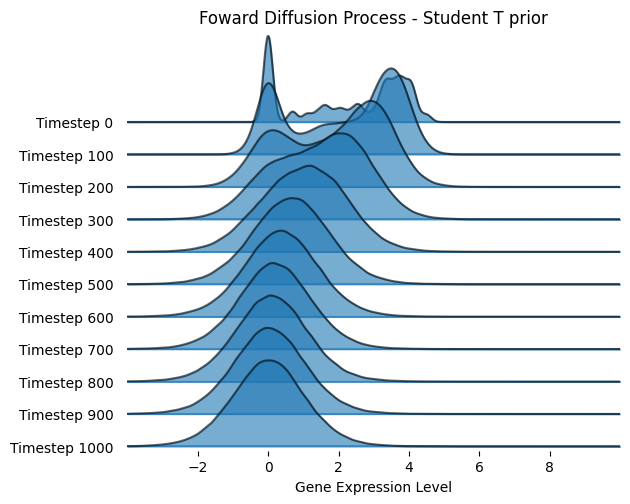

In [43]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from joypy import joyplot

X = adata_sub.X
if scipy.sparse.issparse(X):
    X = X.toarray()
x0 = torch.tensor(X[0], dtype=torch.float32)

diff = DiffusionProcessStudentT(input_dim=x0.shape[0])
n_draws   = 2000

timesteps = list(range(0, config.num_timesteps + 1, 100))   # [0,100,200,…,1000]
all_xt = []

for t in timesteps:
    # clamp to the last valid index (999)
    t_idx = min(t, config.num_timesteps - 1)
    t_tensor = torch.tensor([t_idx], dtype=torch.long)

    # sample as before
    xt_samples = []
    for _ in range(n_draws):
        x_t, _ = diff.add_noise(x0, t_tensor)
        xt_samples.append(x_t.numpy())
    all_xt.append(np.concatenate(xt_samples))

# now feed those *labels* into joyplot
fig, axes = joyplot(
    all_xt,
    labels=[f"Timestep {t}" for t in timesteps],  # now goes up to 1000
    grid=False,
    ylim='auto',
    x_range=(-4,10),
    alpha=0.6
)

# Customize the plot with title and labels
plt.title('Foward Diffusion Process - Student T prior')
plt.xlabel('Gene Expression Level')
plt.ylabel('Density')
plt.show()




In [44]:
classes, auc_normal  = knn_auc_per_class(adata_sub.X.toarray(),
                                         labels_encoded,
                                         generated_data_normal,
                                         generated_labels_normal)

_,       auc_lognorm = knn_auc_per_class(adata_sub.X.toarray(),
                                         labels_encoded,
                                         generated_data_log,
                                         generated_labels_log)

_,       auc_student = knn_auc_per_class(adata_sub.X.toarray(),
                                         labels_encoded,
                                         generated_data_student,
                                         generated_labels_student)


NameError: name 'generated_data_normal' is not defined

In [46]:
classes, auc_vae  = knn_auc_per_class(adata_sub.X.toarray(),
                                         labels_encoded,
                                         X_vae_gen,
                                         labels_vae)

_,       auc_gan = knn_auc_per_class(adata_sub.X.toarray(),
                                         labels_encoded,
                                         X_gan_gen,
                                         labels_gan)

_,       auc_gmm = knn_auc_per_class(adata_sub.X.toarray(),
                                         labels_encoded,
                                         X_gmm_gen,
                                         labels_gmm)

In [ ]:
import pandas as pd

df = pd.DataFrame({
    'Normal prior':    auc_normal,
    'Log-normal prior':auc_lognorm,
    'Student prior': auc_student
}, index=classes)
print(df.shape, df.head()) 

(10, 3)    Normal prior  Log-normal prior  Student-t prior
0      0.534578               1.0         0.565929
1      0.588220               1.0         0.605280
2      0.696615               1.0         0.729071
3      0.812057               1.0         0.840197
4      0.904080               1.0         0.913077


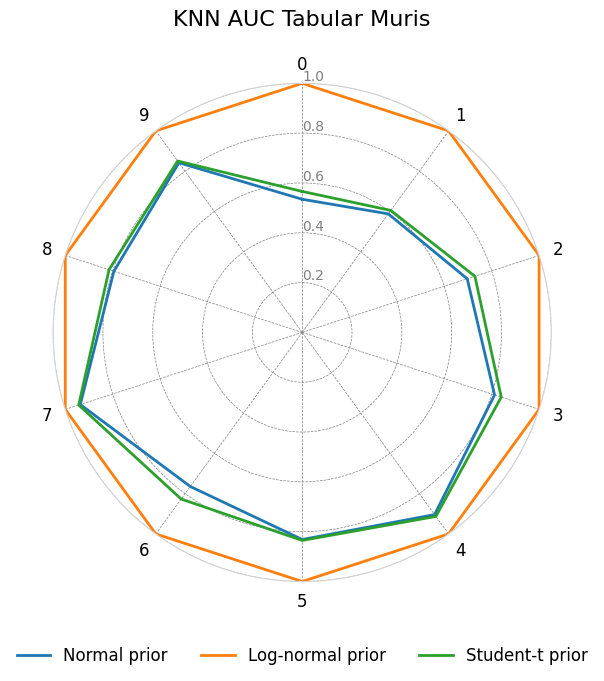

In [48]:
import numpy as np
import matplotlib.pyplot as plt


def plot_radar_lines_only(
    df,
    title: str = None,
    colors: dict = None,
    grid_values: list = [0.2, 0.4, 0.6, 0.8, 1.0]
):
    labels = df.index.tolist()
    N = len(labels)
    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(7,7),
                           subplot_kw=dict(polar=True))
    ax.set_theta_offset(np.pi/2)
    ax.set_theta_direction(-1)

    # radial grid
    ax.set_rgrids(grid_values, angle=0, fontsize=10, color="grey")
    ax.set_ylim(0,1)
    ax.grid(color="grey", linestyle="--", linewidth=0.5)
    spine = ax.spines['polar']
    spine.set_edgecolor('lightgrey')

    # category labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=12)

    # If no explicit colors given, grab a tab10 palette
    if colors is None:
        cmap = plt.get_cmap('tab10')
        colors = {col: cmap(i) for i, col in enumerate(df.columns)}

    # plot only the outline
    for method in df.columns:
        vals = df[method].tolist()
        vals += vals[:1]
        ax.plot(angles, vals,
                color=colors[method],
                linewidth=2,
                label=method)

    # title & legend
    if title:
        ax.set_title(title, y=1.10, fontsize=16)
    ax.legend(loc='upper center',
              bbox_to_anchor=(0.5, -0.10),
              ncol=len(df.columns),
              frameon=False,
              fontsize=12)

    plt.tight_layout()
    plt.show()

# call it:
plot_radar_lines_only(df, title='KNN AUC Tabular Muris')

(10, 3)         VAE  GAN  Stable Diffusion (Normal)
0  0.914181  1.0                   0.534578
1  0.914105  1.0                   0.588220
2  0.987993  1.0                   0.696615
3  0.853684  1.0                   0.812057
4  0.895540  1.0                   0.904080


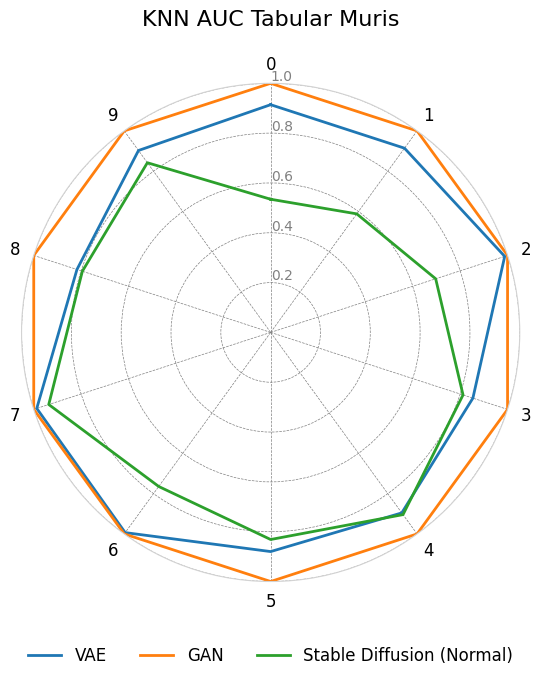

In [49]:
import pandas as pd

df = pd.DataFrame({
    'VAE':auc_vae,
    'GAN':auc_gan,
    'Stable Diffusion (Normal)': auc_normal
}, index=classes)
print(df.shape, df.head()) 

import numpy as np
import matplotlib.pyplot as plt


def plot_radar_lines_only(
    df,
    title: str = None,
    colors: dict = None,
    grid_values: list = [0.2, 0.4, 0.6, 0.8, 1.0]
):
    labels = df.index.tolist()
    N = len(labels)
    angles = np.linspace(0, 2*np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(7,7),
                           subplot_kw=dict(polar=True))
    ax.set_theta_offset(np.pi/2)
    ax.set_theta_direction(-1)

    # radial grid
    ax.set_rgrids(grid_values, angle=0, fontsize=10, color="grey")
    ax.set_ylim(0,1)
    ax.grid(color="grey", linestyle="--", linewidth=0.5)
    spine = ax.spines['polar']
    spine.set_edgecolor('lightgrey')

    # category labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=12)

    # If no explicit colors given, grab a tab10 palette
    if colors is None:
        cmap = plt.get_cmap('tab10')
        colors = {col: cmap(i) for i, col in enumerate(df.columns)}

    # plot only the outline
    for method in df.columns:
        vals = df[method].tolist()
        vals += vals[:1]
        ax.plot(angles, vals,
                color=colors[method],
                linewidth=2,
                label=method)

    # title & legend
    if title:
        ax.set_title(title, y=1.10, fontsize=16)
    ax.legend(loc='upper center',
              bbox_to_anchor=(0.5, -0.10),
              ncol=len(df.columns),
              frameon=False,
              fontsize=12)

    plt.tight_layout()
    plt.show()

# call it:
plot_radar_lines_only(df, title='KNN AUC Tabular Muris')

In [51]:
ed_norm   = classwise_energy_distance(adata_sub.X.toarray(),
                                         generated_data_normal,
                                         labels_encoded,
                                         generated_labels_normal)
mmd_norm  = mmd_per_class(adata_sub.X.toarray(),
                                         labels_encoded,
                                         generated_data_normal,
                                         generated_labels_normal) 
scc_norm  = spearman_per_class(adata_sub.X.toarray(), 
                                labels_encoded, 
                                generated_data_normal, 
                                generated_labels_normal)

ed_log    = classwise_energy_distance(adata_sub.X.toarray(),
                                         generated_data_log,
                                         labels_encoded,
                                         generated_labels_log)
mmd_log   = mmd_per_class(adata_sub.X.toarray(),
                                         labels_encoded,
                                         generated_data_log,
                                         generated_labels_log)
scc_log   = spearman_per_class(adata_sub.X.toarray(), 
                                labels_encoded, 
                                generated_data_log, 
                                generated_labels_log)

ed_stu    = classwise_energy_distance(adata_sub.X.toarray(),
                                         generated_data_student,
                                         labels_encoded,
                                         generated_labels_student)
mmd_stu   = mmd_per_class(adata_sub.X.toarray(),
                                         labels_encoded,
                                         generated_data_student,
                                         generated_labels_student)
scc_stu   = spearman_per_class(adata_sub.X.toarray(), 
                                labels_encoded, 
                                generated_data_student, 
                                generated_labels_student)

Energy Distance (per class):
Class B cell: 0.2544
Class T cell: 0.2765
Class basal cell of epidermis: 0.2733
Class chondrocyte: 0.1977


Class endothelial cell: 0.2457
Class fibroblast: 0.2107
Class keratinocyte: 0.2236
Class macrophage: 0.3264
Class mesenchymal progenitor cell: 0.2387
Class mesenchymal stem cell: 0.2394
Energy Distance (per class):
Class B cell: 6.9405
Class T cell: 6.9238
Class basal cell of epidermis: 5.3670
Class chondrocyte: 6.8179
Class endothelial cell: 6.9185
Class fibroblast: 6.9847
Class keratinocyte: 5.2087
Class macrophage: 5.9953
Class mesenchymal progenitor cell: 6.9126
Class mesenchymal stem cell: 6.5210
Energy Distance (per class):
Class B cell: 0.2024
Class T cell: 0.1994
Class basal cell of epidermis: 0.2152
Class chondrocyte: 0.1974
Class endothelial cell: 0.2806
Class fibroblast: 0.2171
Class keratinocyte: 0.3175
Class macrophage: 0.4768
Class mesenchymal progenitor cell: 0.1681
Class mesenchymal stem cell: 0.2797


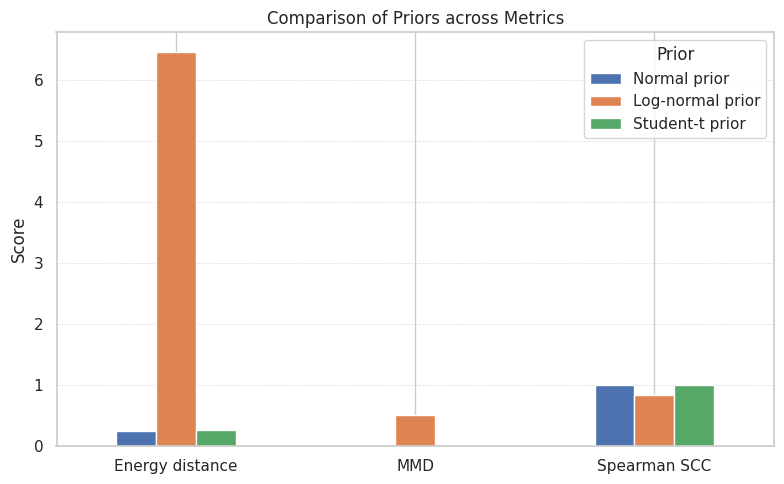

In [53]:
import pandas as pd

df_metrics = pd.DataFrame({
    'Normal prior':      [ed_norm,  mmd_norm,  scc_norm],
    'Log-normal prior':  [ed_log,   mmd_log,   scc_log ],
    'Student-t prior':   [ed_stu,   mmd_stu,   scc_stu ],
}, index=['Energy distance','MMD','Spearman SCC'])

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8,5))
df_metrics.plot(kind='bar', ax=ax)

ax.set_ylabel('Score')
ax.set_title('Comparison of Priors across Metrics')
ax.set_xticklabels(df_metrics.index, rotation=0)   # keep metric names horizontal
ax.legend(title='Prior', loc='upper right')
ax.grid(axis='y', linestyle='--', linewidth=0.5, alpha=0.7)

plt.tight_layout()
plt.show()

In [11]:
for code, label in enumerate(le.classes_):
    print(f"{code}: {label}")

0: B cell
1: T cell
2: basal cell of epidermis
3: chondrocyte
4: endothelial cell
5: fibroblast
6: keratinocyte
7: macrophage
8: mesenchymal progenitor cell
9: mesenchymal stem cell
